# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The DFC bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at DFC bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

## **Importing necessary libraries**

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [ ]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libaries to help with data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as stats

# To tune model, get different metric scores, and split data
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    classification_report,
    roc_auc_score,
    ConfusionMatrixDisplay,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer
from sklearn import metrics

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

# To suppress scientific notations
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

## **Loading the dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
credit = pd.read_csv("/content/drive/MyDrive/AIML_UTA/Advanced Machine Learning/Project/BankChurners.csv")
data = credit.copy()

## **Data Overview**

- Observations
- Sanity checks

#### **Data Display**

In [ ]:
# view first 5 rows of the dataset
data.head(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
# understand the shape of the data set
print("There are", data.shape[0], "rows and", data.shape[1], "columns in the data set.")

There are 10127 rows and 21 columns in the data set.


#### **Data Types and Null counts**

In [ ]:
# understand the data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

Observations:

*   There are null values in Education_Level and Marital_Status.
*   There are int, float and object data types.
*   We can convert object data to category data and encode target attribute for easiness of further analysis.

#### **Duplicates**

In [ ]:
# identify duplicates
data.duplicated().sum()

0

#### **Data Summary**

In [ ]:
# summary of numerical data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


Observations:

*   Age of the customers range from 26 to 73, with a mean of 46 years.
*   Credit_Limit, Avg_Open_To_Buy, Total_Trans_Amt outliers, Total_Trans_Ct variables contain outliers.
*   Average inactive time is little above 2 months, maximum is 6 months.
*   Average Total_Revolving_Bal is 1162.

*   Average open to buy ranges from 3 to 34516 dollars.
*   Average credit limit is 8632 dollars, with a maximum of $34516.




In [ ]:
# summary of categorical data
data.describe(include=["object"]).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


In [ ]:
# understand the value counts in each category
df = data[['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']]
for col in df:
  print(col, df[col].value_counts(normalize = True, dropna=False))
  print('-----------------------------')

Attrition_Flag Attrition_Flag
Existing Customer   0.839
Attrited Customer   0.161
Name: proportion, dtype: float64
-----------------------------
Gender Gender
F   0.529
M   0.471
Name: proportion, dtype: float64
-----------------------------
Education_Level Education_Level
Graduate        0.309
High School     0.199
NaN             0.150
Uneducated      0.147
College         0.100
Post-Graduate   0.051
Doctorate       0.045
Name: proportion, dtype: float64
-----------------------------
Marital_Status Marital_Status
Married    0.463
Single     0.389
NaN        0.074
Divorced   0.074
Name: proportion, dtype: float64
-----------------------------
Income_Category Income_Category
Less than $40K   0.352
$40K - $60K      0.177
$80K - $120K     0.152
$60K - $80K      0.138
abc              0.110
$120K +          0.072
Name: proportion, dtype: float64
-----------------------------
Card_Category Card_Category
Blue       0.932
Silver     0.055
Gold       0.011
Platinum   0.002
Name: proportion, d

Observations:

*   Attrition_Flag is our target variable, which has 84% existing customers and 16% attrited customers. Target is imbalanced.

*   Number of male to female customers are 53:47.

*   There are 6 Education_Levels, 36% graduates, 23% high school, 17% uneducated, 11% college, 6% post-graduate, 5% doctorate and some data are missing.

*   About 46% of the customers are married, 39% single, 7% divorced and some data are missing.

*   There are 6 levels in income category, 35% customers earn less than 40 thousand dollars, only 7% earn more than 120 thousnd dollars. Category 'abc' doesn't make sense, there data might be missing.

*   There are 4 card categories, 93% of them are blue, 5.5% silver, 1% gold and 0.1% platinum card holders.

#### **Missing Values**

In [ ]:
# identify missing values
data.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [ ]:
# selecting the instances where missing value is greater than 0
pd.DataFrame({'Count':data.isnull().sum()[data.isnull().sum()>0],'Percentage':(data.isnull().sum()[data.isnull().sum()>0]/data.shape[0])*100})

,Count,Percentage
Education_Level,1519,15.000
Marital_Status,749,7.396


## **Data Pre Processing**

#### Dropping columns

In [ ]:
# identifying ID columns
data['CLIENTNUM'].nunique()

10127

In [ ]:
# CLIENTNUM column comprised of unique values so we can drop it
data = data.drop(['CLIENTNUM'], axis=1)

#### Convert data types

In [ ]:
# Convert object to categorical data
for feature in data.columns: # Loop through all columns in the dataframe
  if data[feature].dtype == 'object': # Only apply for columns with categorical strings
    data[feature] = pd.Categorical(data[feature])# Replace strings with an integer
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  category
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

## **Exploratory Data Analysis (EDA)**

#### **Necessary functions for Exploratory Data Analysis**

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(ascending=False),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [ ]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [ ]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

#### **Summary of Univariate Analysis**
1. Target attribute Attrition_Flag is imbalance. 16% belong to Attrited class.
2. Gender counts are slightly higher for females ~ 53%.
3. Dependent count is normally distributed. 27% of customers have 3 dependents followed by customers who has 2 dependents.
4. 31% of customers are graduates followed by 20% of high school graduates, 15% data are missing, we should carefully observe these missing data later.
5. 46.3% customers are married nd almost 39% are single. There are 7.4% missing data, that we should examine further.
6. 35.2% of the customers are belong to lowest income category class. Class 'abc' could be missing data, so we have to further analyze this attribute.
7. 93.2% customers hold 'Blue' cards, while only 0.2% of them have 'Platinum' card.
8. Relationship count varies from 1-6, and 23% have 3 total relationships.
9. Majority about 38% shows 3 months inactivity followed by 32.4% 2 months inactivity.
10. Only 0.5% customers contacted 6 times for the last 12 months followed by customers who has contacted the bank 5 times.
11. Customer age is normally distributed, with a few outliers.
12. Months on book has outliers in both ends, however the distribution is normal with a high central peak.
13. Credit limit is heavily right skewed and unusually high credit limit at the right edge has unusually high count of customers. We should exime this attribute more closely.
14. Total revolving balance is left skewed with high count of zero balance customers. These zeros are true as Credit_Limit is equal to Avg_Open_To_Buy.
15. Avg_Open_To_Buy is right skewed.
16. Total amnt chng is right skewed. There are many outliers.
17. Total trans amnt is right skewed. Attribute has many peaks, and this could be due to mixed up Gausians (e.g., sampled for different purposes), and it contains many outliers.
18. Total_Trans_Ct is right skewed with a few outliers.
19. Total_Ct_Chng_Q4_Q1 contains outliers in both tails right and the left.
20. Avg_Utilization_Ratio is right skewed.


**1. Observations on Attrition_Flag**

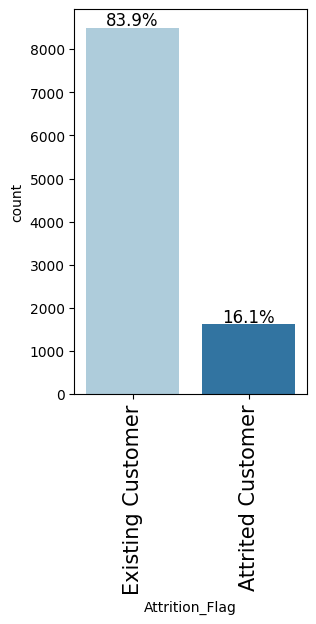

In [ ]:
labeled_barplot(data, 'Attrition_Flag', perc=True)

**2. Observations on Gender**

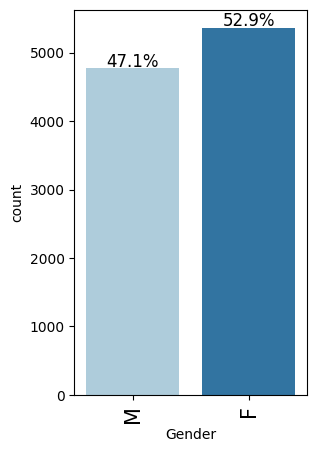

In [ ]:
labeled_barplot(data, 'Gender', perc=True)

**3. Observations on Dependent_count**

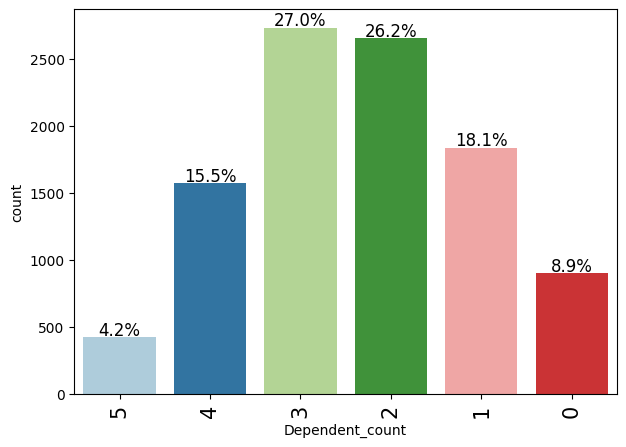

In [ ]:
labeled_barplot(data, 'Dependent_count', perc=True)

**4. Observations on Education_Level**

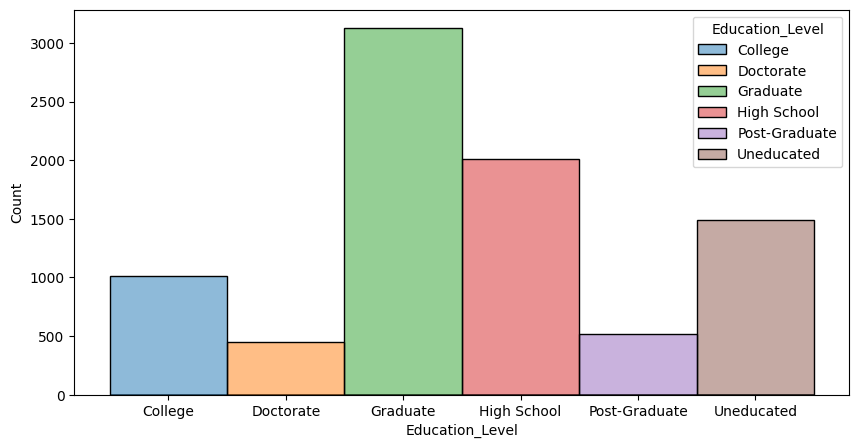

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(data, x='Education_Level', hue='Education_Level');

Q2. What is the distribution of the level of education of customers?

Education_Level shows a faily normal distribution, majority of customers are graduates (assuming that this category includes college graduates, not high school graduates).

**5. Observations on Marital_Status**

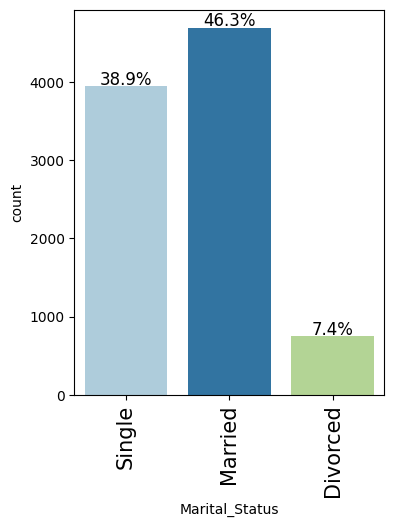

In [ ]:
labeled_barplot(data, 'Marital_Status', perc=True)

**6. Observations on Income_Category**

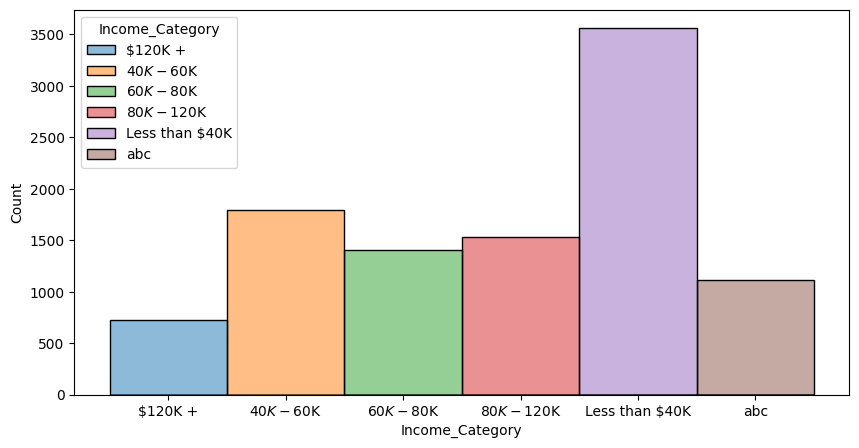

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(data=data, x='Income_Category', hue='Income_Category');

Q3. What is the distribution of the level of income of customers?

Without considering the class 'abc', Income_Category shows a right skewed distribution. Where majority of the customers fall in low income group and minority falls in high income end.

**7. Observations on Card_Category**

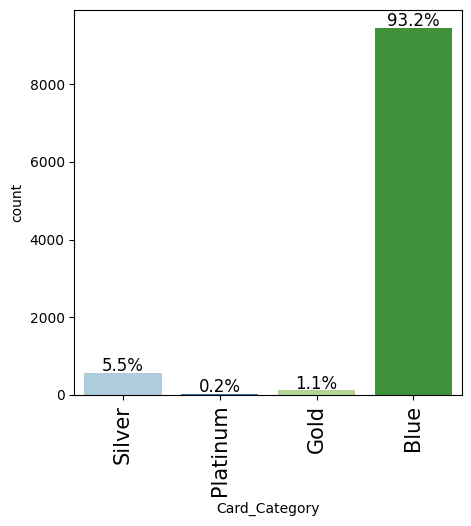

In [ ]:
labeled_barplot(data, 'Card_Category', perc=True)

**8. Observations on Total_Relationship_Count**

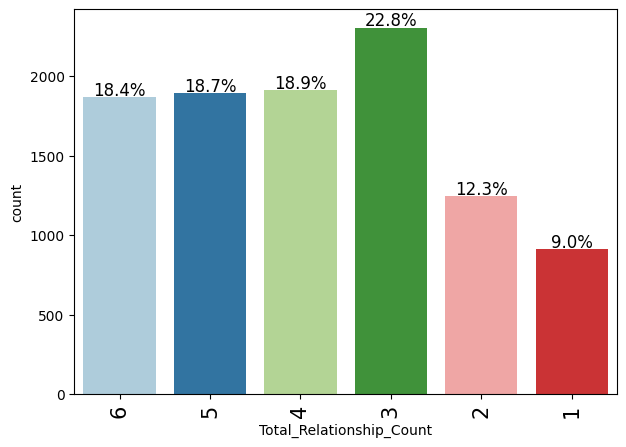

In [ ]:
labeled_barplot(data, 'Total_Relationship_Count', perc=True)

**9. Observations on Months_Inactive_12_mon**

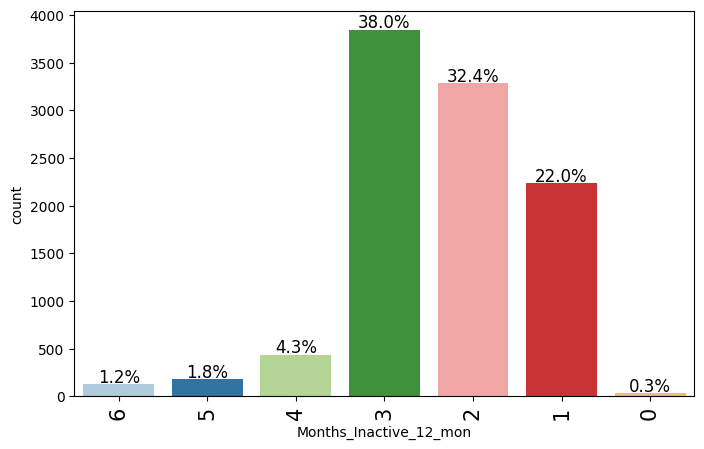

In [ ]:
labeled_barplot(data, 'Months_Inactive_12_mon', perc=True)

**10. Observations on Contacts_Count_12_mon**

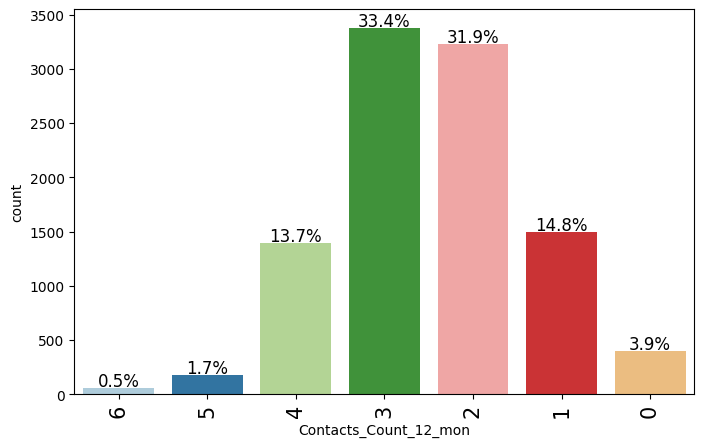

In [ ]:
labeled_barplot(data, 'Contacts_Count_12_mon', perc=True)

**11. Observations on Customer_Age**

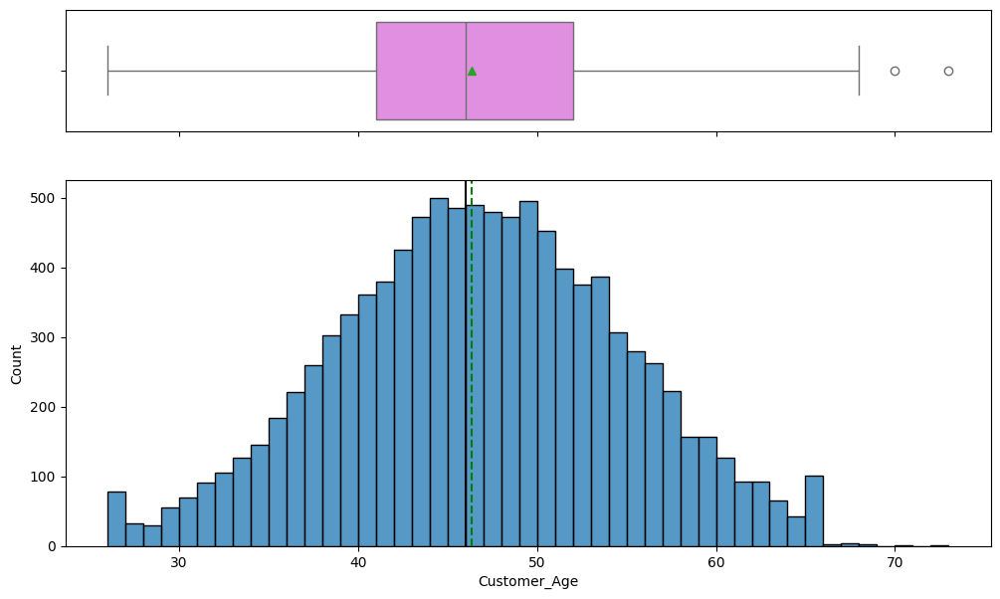

In [ ]:
histogram_boxplot(data, 'Customer_Age')

**12. Observations on Months_on_book**

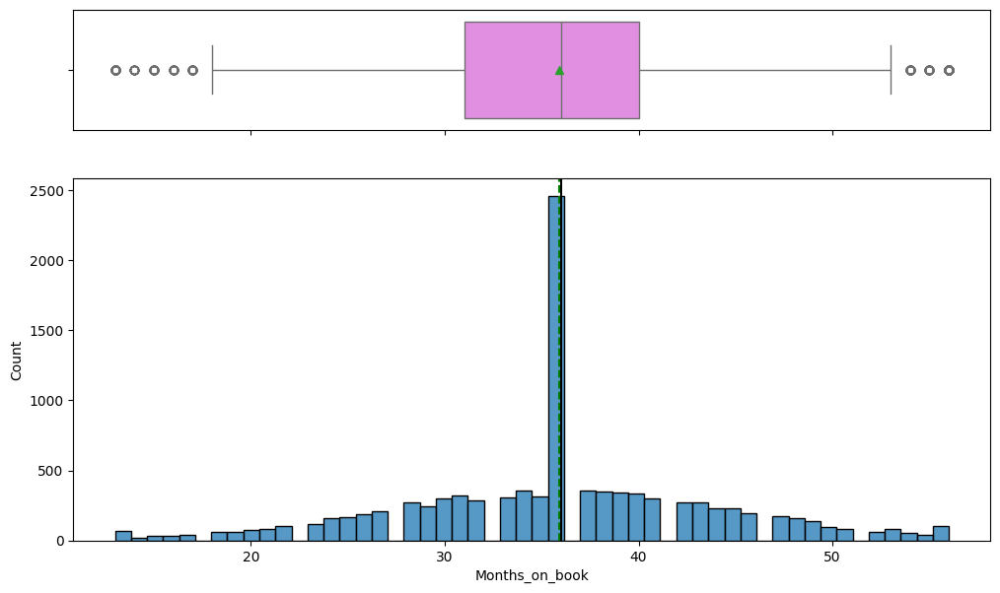

In [ ]:
histogram_boxplot(data, 'Months_on_book')

**13. Observations on Credit_Limit**

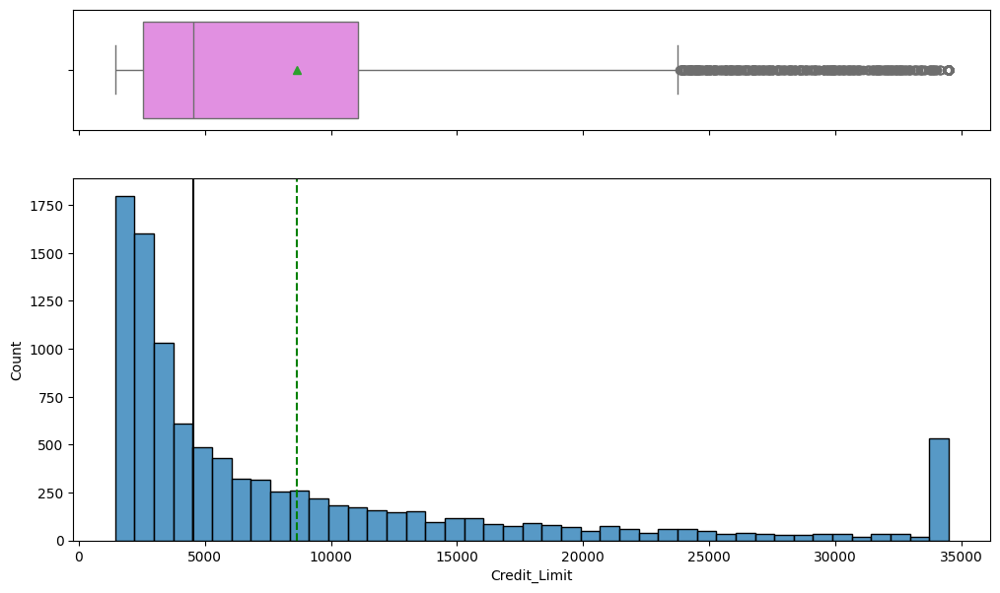

In [ ]:
histogram_boxplot(data, 'Credit_Limit')

**14. Observations on Total_Revolving_Bal**

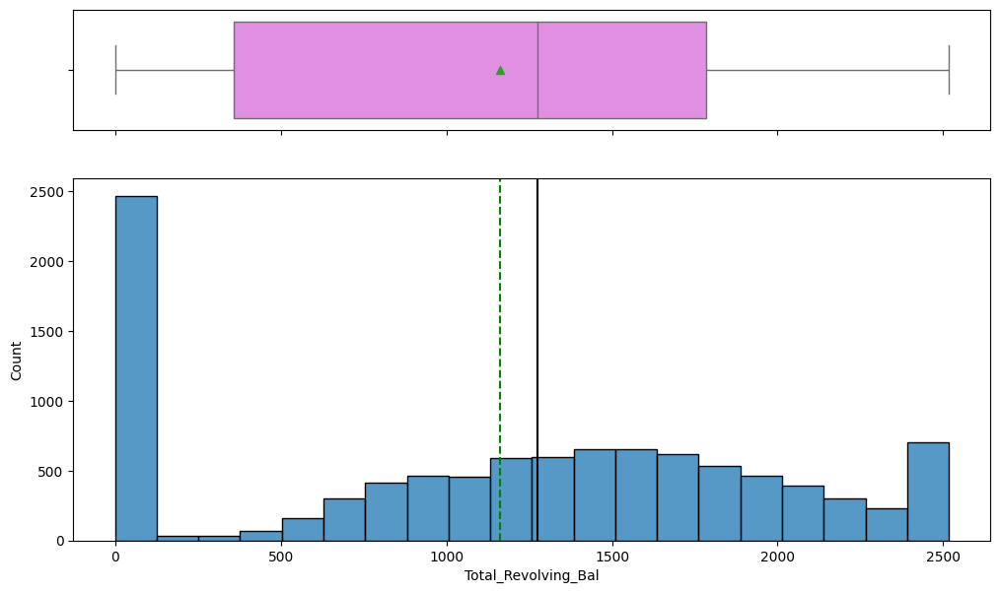

In [ ]:
histogram_boxplot(data, 'Total_Revolving_Bal')

In [ ]:
# checking the zero values
data[data['Total_Revolving_Bal'] == 0]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000
12,Existing Customer,56,M,1,College,Single,$80K - $120K,Blue,36,3,6,0,11751.000,0,11751.000,3.397,1539,17,3.250,0.000
21,Attrited Customer,62,F,0,Graduate,Married,Less than $40K,Blue,49,2,3,3,1438.300,0,1438.300,1.047,692,16,0.600,0.000
24,Existing Customer,54,M,2,NaN,Married,$80K - $120K,Blue,42,4,2,3,12217.000,0,12217.000,1.075,1110,21,0.750,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10109,Existing Customer,47,M,5,High School,Single,Less than $40K,Blue,35,4,3,5,4165.000,0,4165.000,0.813,17093,111,0.820,0.000
10112,Attrited Customer,33,M,2,College,Married,$120K +,Gold,20,2,1,4,34516.000,0,34516.000,1.004,9338,73,0.622,0.000
10114,Existing Customer,29,M,0,Graduate,Married,Less than $40K,Blue,15,3,1,5,4700.000,0,4700.000,0.617,14723,96,0.655,0.000
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000


Note: Checked whether if Total revolving balance 0 is true or not. It looks like these customers have Credit_limit = Avg open to buy, and they shouldn't have a revolving balance.

**15. Observations on Avg_Open_To_Buy**

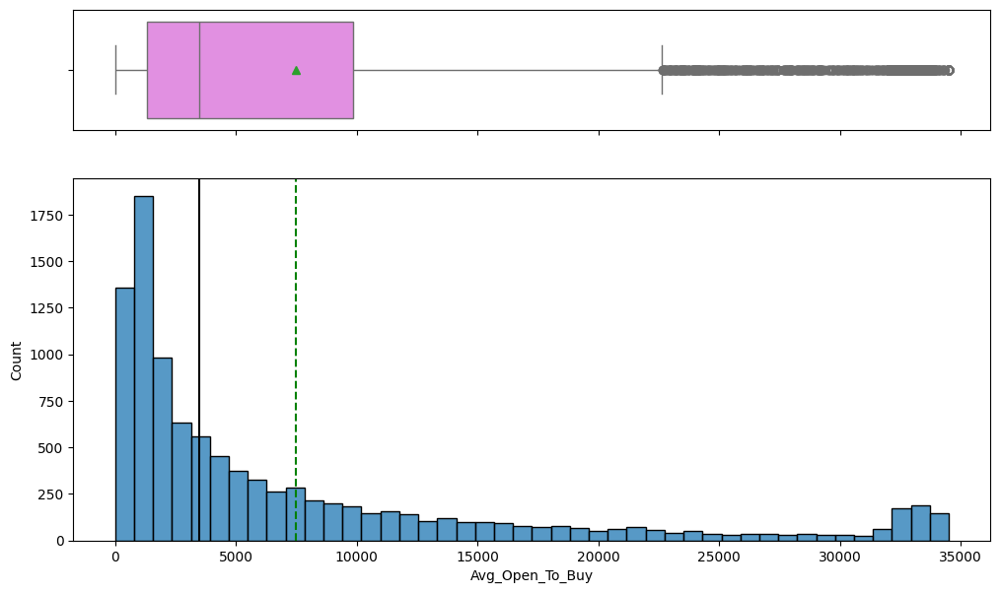

In [ ]:
histogram_boxplot(data, 'Avg_Open_To_Buy')

**16. Observations on Total_Amt_Chng_Q4_Q1**

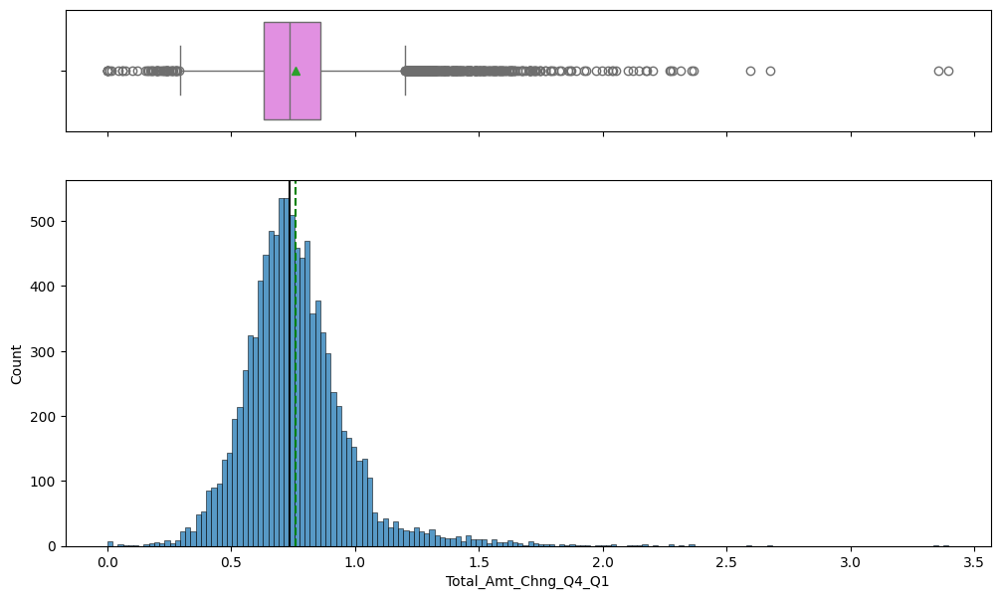

In [ ]:
histogram_boxplot(data, 'Total_Amt_Chng_Q4_Q1')

**17. Observations on Total_Trans_Amt**

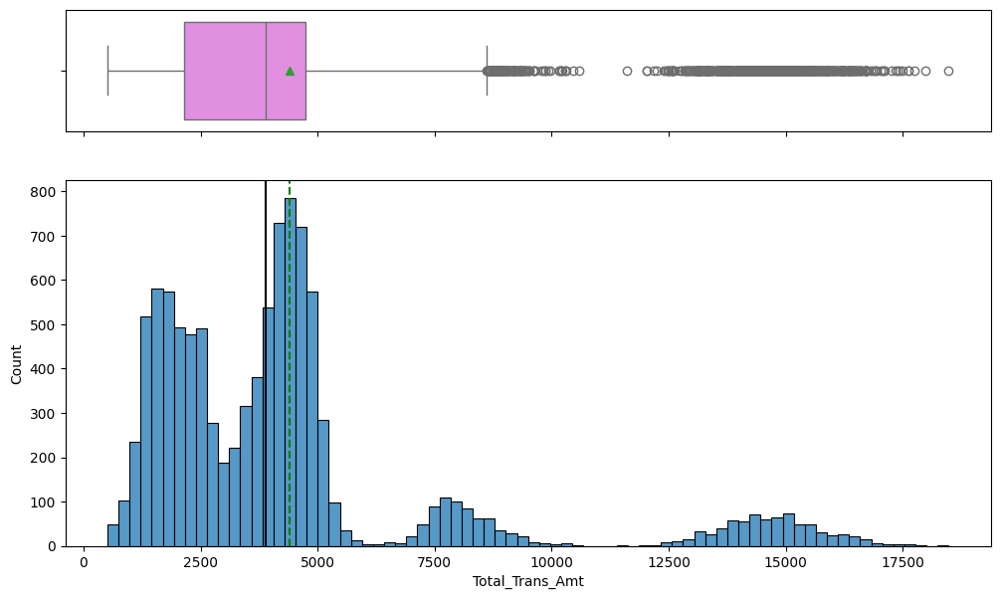

In [ ]:
histogram_boxplot(data, 'Total_Trans_Amt')

Q1. How is the total transaction amount distributed?

Total_Trans_Amt has many peaks, and this could be due to mixed up Gausians (e.g., sampled for different purposes), and it contains many outliers.

**18. Observations on Total_Trans_Ct**

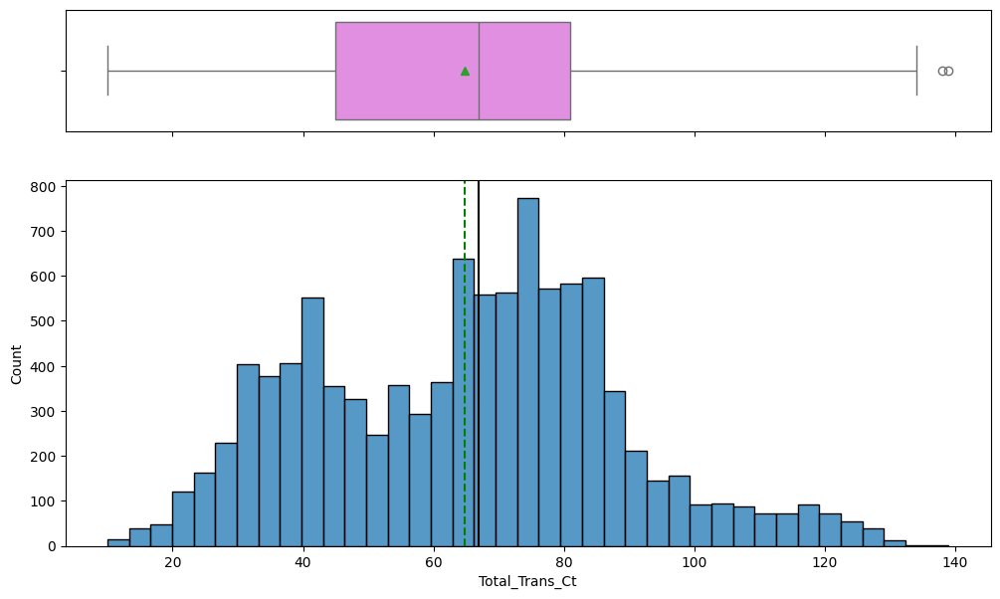

In [ ]:
histogram_boxplot(data, 'Total_Trans_Ct')

**19. Observations on Total_Ct_Chng_Q4_Q1**

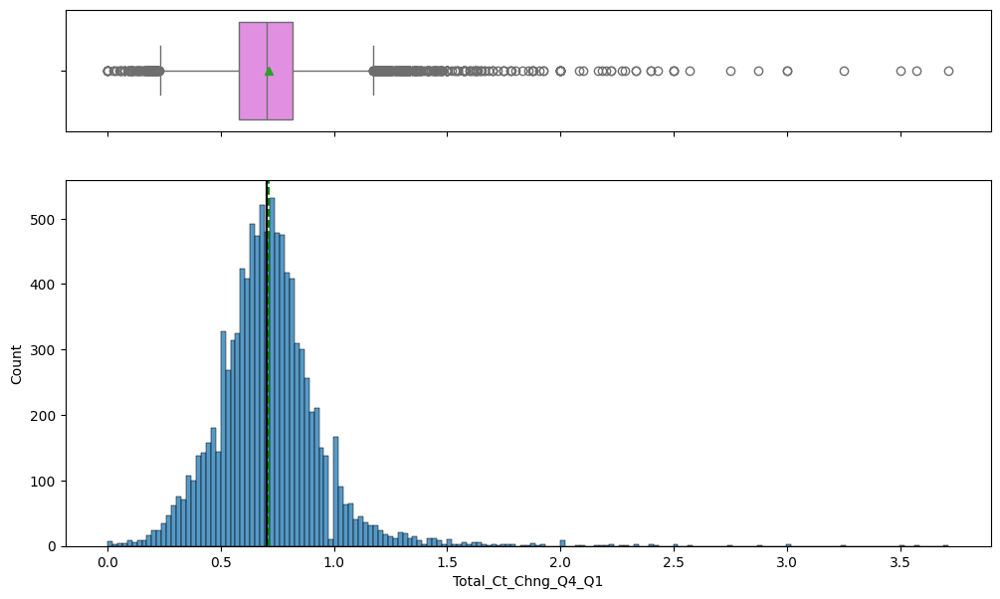

In [ ]:
histogram_boxplot(data, 'Total_Ct_Chng_Q4_Q1')

**20. Observations on Avg_Utilization_Ratio**

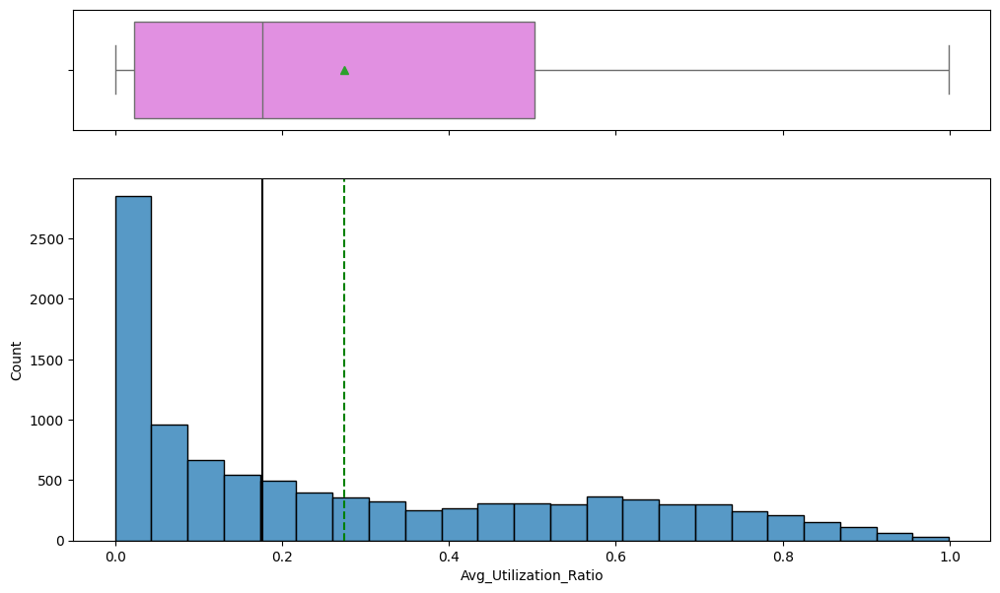

In [ ]:
histogram_boxplot(data, 'Avg_Utilization_Ratio')


#### **Summary of Bivariate Analysis**

1. Attributes like Total_Trans_Amt, Total_Trans_Ct, Months_Inactive_12_mon, Cntacts_Count_12_mnt and Total_amount_change might be very good attributes for predicting customers who is going to attrite over who doesn't.
2. Also based on the number of peaks in various attributes we should try trees with max_depth 6, 12 etc.
3. Credit_Limit vs Avg_Open_to_Buy shows very high positive correlation.
4. Credit_Limit vs Avg_Utilization_Ratio also shows some non-linear relationship.
5. Percentage of female attrited customers are higher than that of males.
6. Percentage of attrited customers are faily uniform over the dependent count.
7. Percentage of attrition is highest for customers who has Doctorates followed by Post-Graduate customers.
8. Percentage of attrition is fairly similar for different Marital_Status.
9. Percentage of attrition is lowest for 60K-80K Income_Category group customers.
10. Percentage of attrition is highest for Plainum card holders followed by Gold card holders.
11. When the Total_Relationship_Count is lower there is a tendency towrds attrition, while when it is high such as 4,5,6 then percentage attrition is low.
12. Percentage attrition is highest for the zero months inactive customers followed by 4, 3, 5, 2, 6 and 1 months inactivity. We should evaluate this 0 value more.
13. Customers who had highest number of contacts within last 12 months show highest attrition rate followed by the decreasing number of contacts in order.
14. Customer age is normally distributed for existing and attrited customers, median age is slightly higher for the attrited customers.
15. Months_on_book attribute shows a peculiar distribution for both classes with a slightly higher range for existing customers. And there are some outliers in both classes.
16. Credit limit distributions are also similar for both target classes. Both classes show many outliers, while attrited class shows a narrower range.
17. Total_Revolving_Balance distribution is different for two target classes. The median is higher for the existing customers.
18. Avg_Open_to_Buy shows similar distributions for two classes. Both classes have many outliers and the attrited class has a narrow range.
19. Total_Amt_Chng_Q4-Q1 has fairly normal distribution for attrited class and right skewed for existig class. Range for attrited class is higher than existing class and it class has many outliers.
20. Total_Trans_Amt has many peaks, and both classes show the same trend. This could be due to mixed up Gausians, as they also contain many outliers. Total_Trans_Amt range and median are higher for the existing class. This attribute clearly separate the two target classes.
21. Total_Trans_Ct also behave quite similar to Total_Trans_Amt.
22. Total_Ct_hng_Q4_Q1 has right skewed distribution for both classes. Attrited
class has a high range and lower median than Existing class.
23. Avg_Utilization_Ratio shows a right skewed distribution in both classes, however Attrited class has many outiers and shows a narrow range.

**Observations on Pairplot**

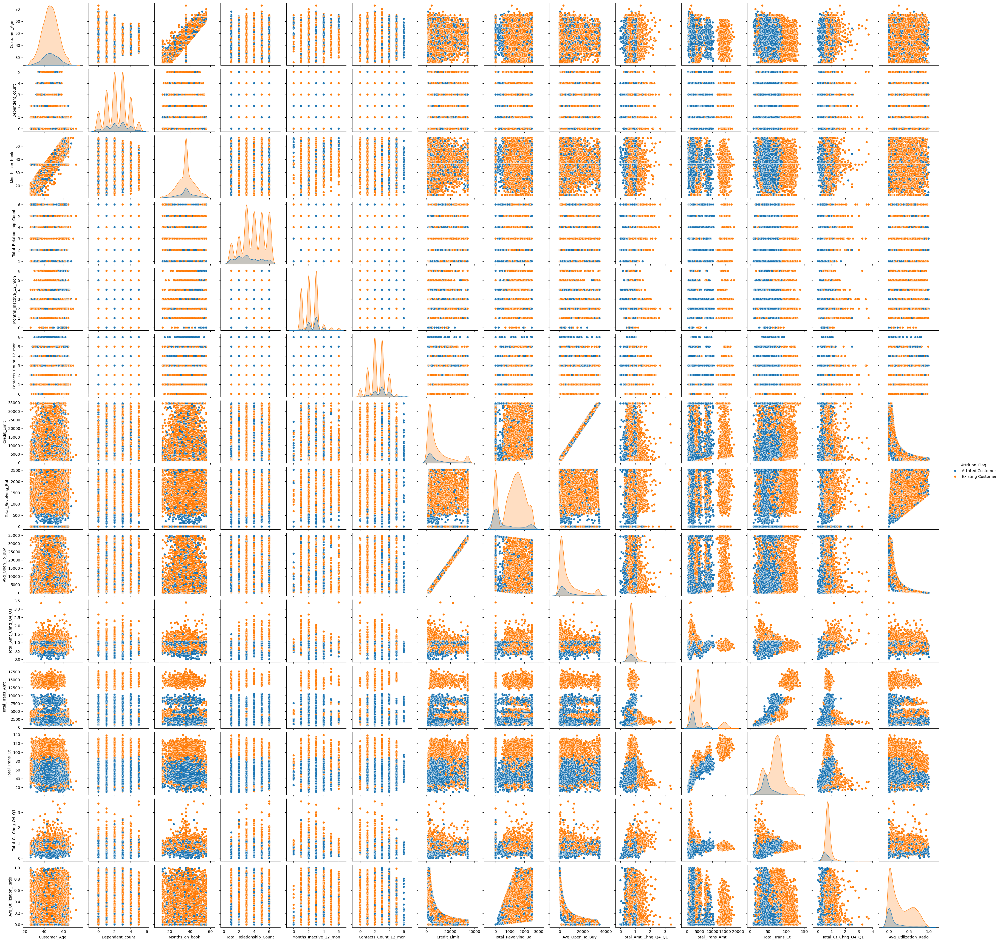

In [ ]:
# Let's plot the pairplot to observe all the relationships between attributes
sns.pairplot(data, hue='Attrition_Flag')

**Observations on Heatmap**

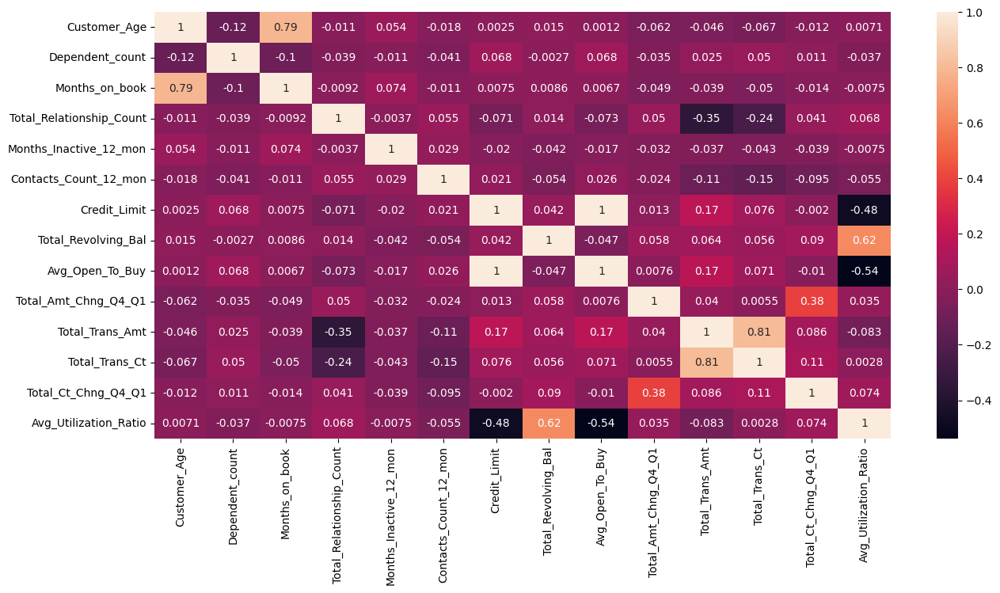

In [ ]:
numeric_data = data.select_dtypes(include='number')

plt.figure(figsize=(15, 7))
sns.heatmap(numeric_data.corr(), annot=True);  # plotting the correlation matrix

Q6. What are the attributes that have a strong correlation with each other?

Positive Correlations:

*   Credit_Limit vs Avg_Open_To_Buy - 100%
*   Total_Trans_Amt vs Total_Trans_Ct - 81%
*   Customer_Age vs Months_On_Book - 79%
*   Total Revolving_Balance vs Avg_Utilization_Ratio - 62%
*   Total_Amt_Chng Q4-Q1 vs Total_Ct_Chng Q4-Q1 - 38%

Negative Correlations:
*   Avg_Utilization_Ratio vs Avg_Open_To_Buy - 54%
*   Credit_Limit vs Avg_Utilization_Ratio - 48%


**1. Attrition_Flag vs Gender**

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


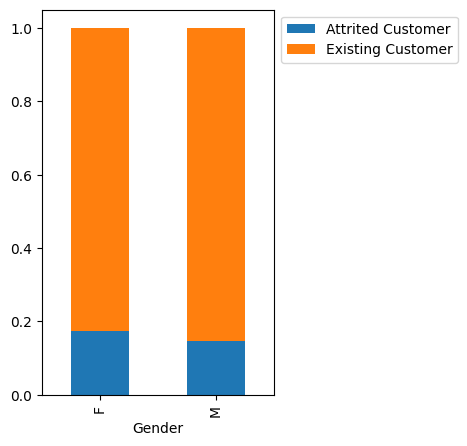

In [ ]:
stacked_barplot(data, 'Gender', 'Attrition_Flag')

**2. Attrition_Flag vs Dependent_count**

Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


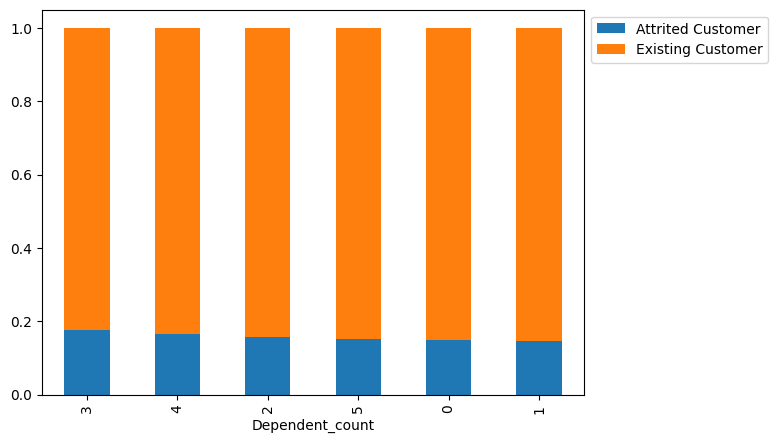

In [ ]:
stacked_barplot(data, 'Dependent_count', 'Attrition_Flag')

**3. Attrition_Flag vs Education_Level**

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


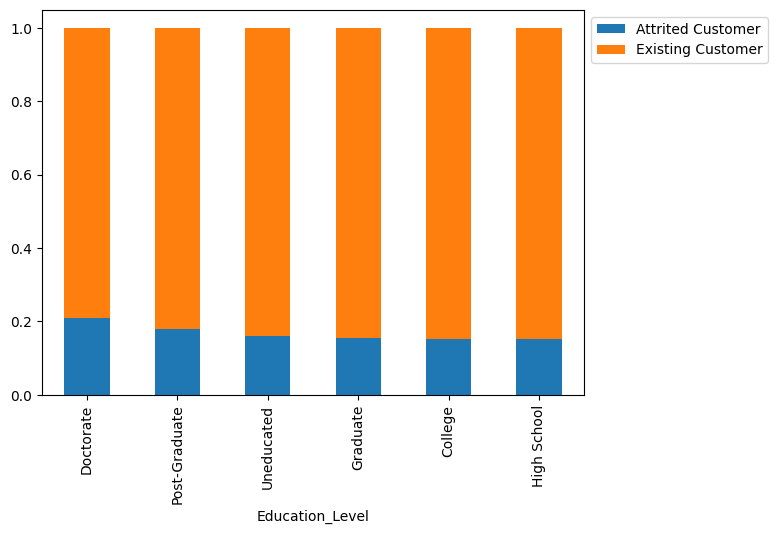

In [ ]:
stacked_barplot(data, 'Education_Level', 'Attrition_Flag')

**4. Attrition_Flag vs Marital_Status**

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


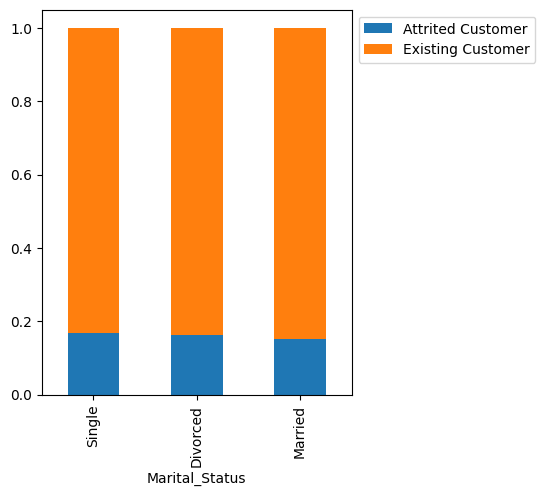

In [ ]:
stacked_barplot(data, 'Marital_Status', 'Attrition_Flag')

**5. Attrition_Flag vs Income_Category**

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


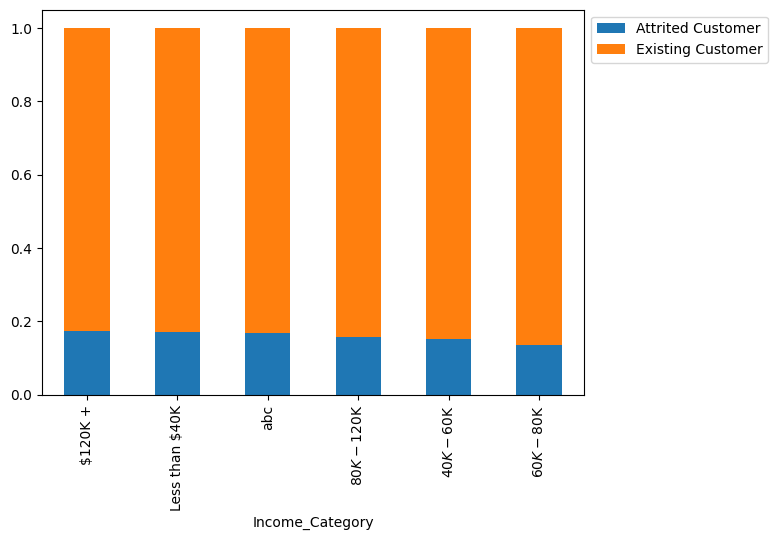

In [ ]:
stacked_barplot(data, 'Income_Category', 'Attrition_Flag')

**6. Attrition_Flag vs Card_Category**

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


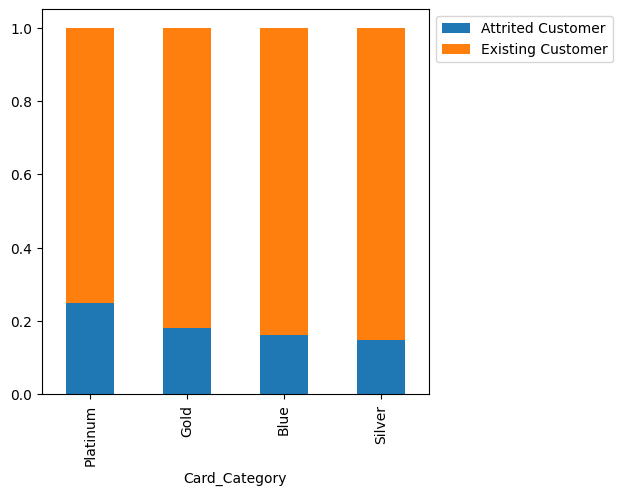

In [ ]:
stacked_barplot(data, 'Card_Category', 'Attrition_Flag')

**7. Attrition_Flag vs Total_Relationship_Count**

Attrition_Flag            Attrited Customer  Existing Customer    All
Total_Relationship_Count                                             
All                                    1627               8500  10127
3                                       400               1905   2305
2                                       346                897   1243
1                                       233                677    910
5                                       227               1664   1891
4                                       225               1687   1912
6                                       196               1670   1866
------------------------------------------------------------------------------------------------------------------------


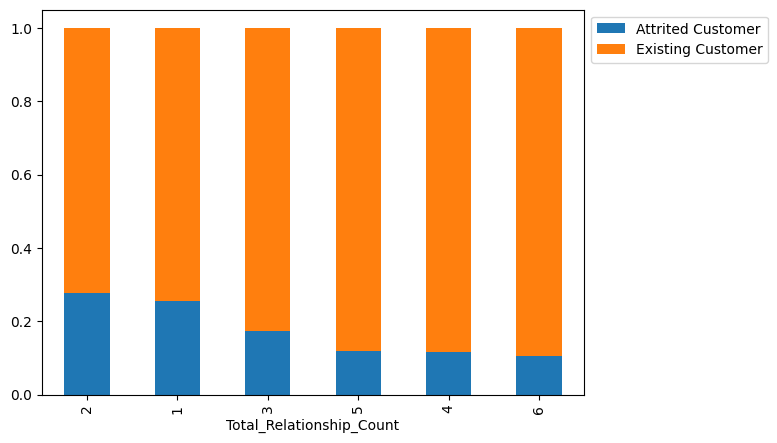

In [ ]:
stacked_barplot(data, 'Total_Relationship_Count', 'Attrition_Flag')

**8. Attrition_Flag vs Months_Inactive_12_mon**

Attrition_Flag          Attrited Customer  Existing Customer    All
Months_Inactive_12_mon                                             
All                                  1627               8500  10127
3                                     826               3020   3846
2                                     505               2777   3282
4                                     130                305    435
1                                     100               2133   2233
5                                      32                146    178
6                                      19                105    124
0                                      15                 14     29
------------------------------------------------------------------------------------------------------------------------


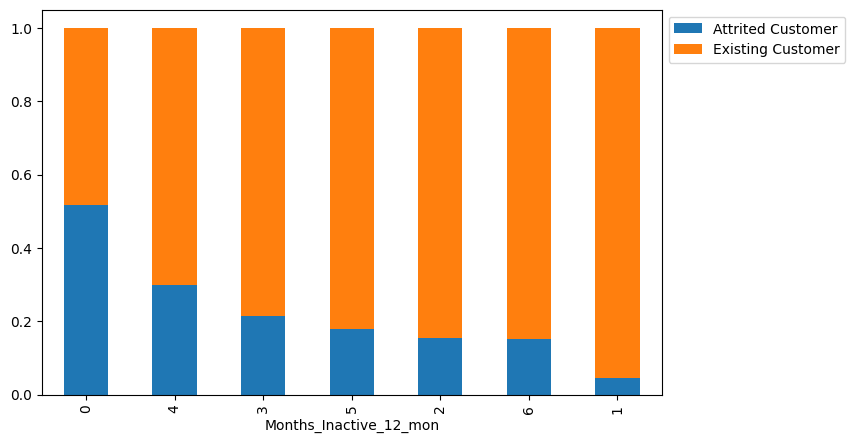

In [ ]:
stacked_barplot(data, 'Months_Inactive_12_mon', 'Attrition_Flag')

Q5. How does the number of months a customer was inactive in the last 12 months (Months_Inactive_12_mon) vary by the customer's account status (Attrition_Flag)?

Customers who has only inactive less than a month shows highest percentage of attrition followed by customers who showed inactivity for 4, 3, 5 months.

**9. Attrition_Flag vs Contacts_Count_12_mon**

Attrition_Flag         Attrited Customer  Existing Customer    All
Contacts_Count_12_mon                                             
All                                 1627               8500  10127
3                                    681               2699   3380
2                                    403               2824   3227
4                                    315               1077   1392
1                                    108               1391   1499
5                                     59                117    176
6                                     54                  0     54
0                                      7                392    399
------------------------------------------------------------------------------------------------------------------------


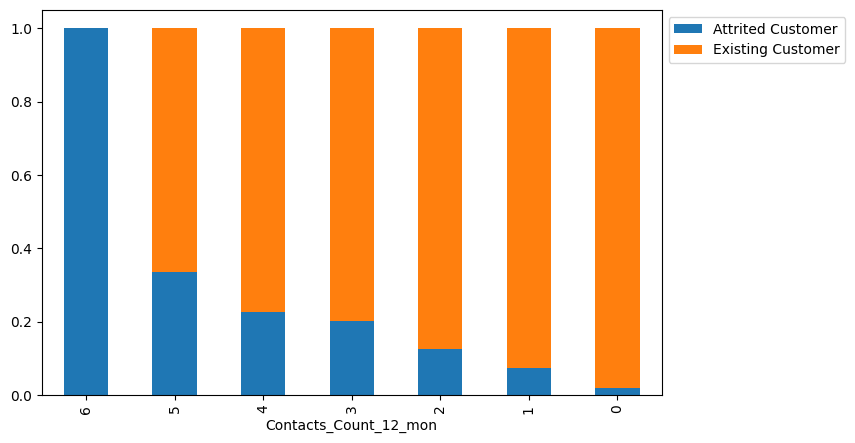

In [ ]:
stacked_barplot(data, 'Contacts_Count_12_mon', 'Attrition_Flag')

**10. Attrition_Flag vs Customer_Age**

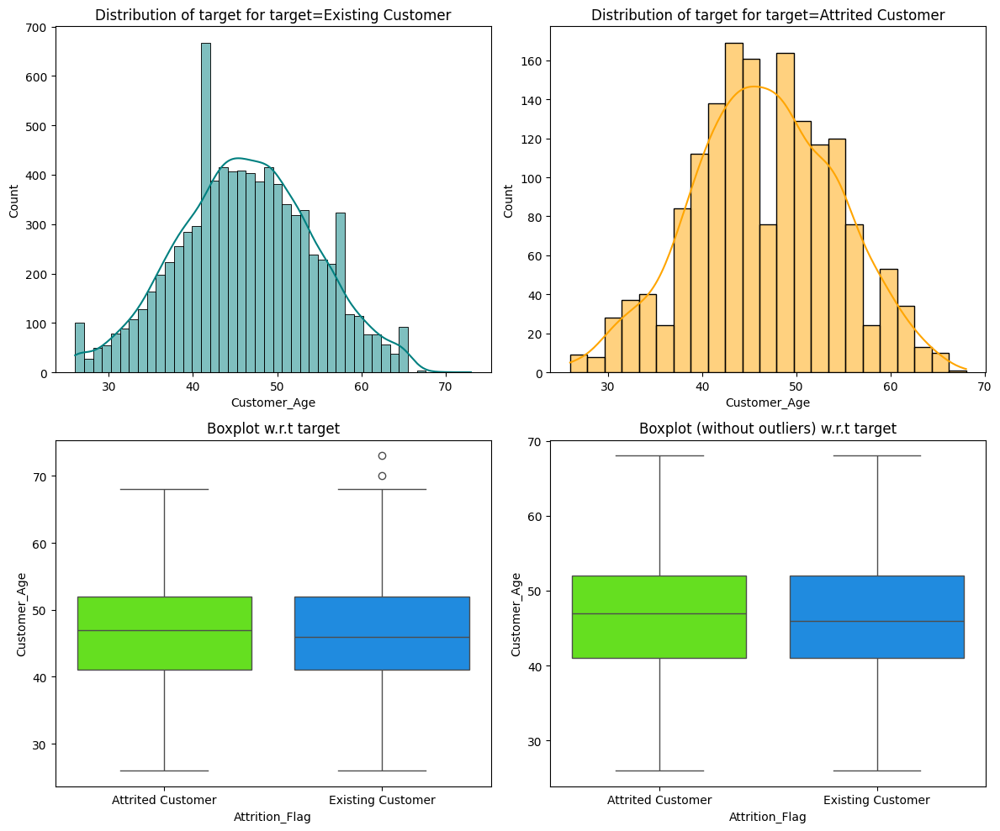

In [ ]:
distribution_plot_wrt_target(data, 'Customer_Age', 'Attrition_Flag')

**11. Attrition_Flag vs Months_on_book**

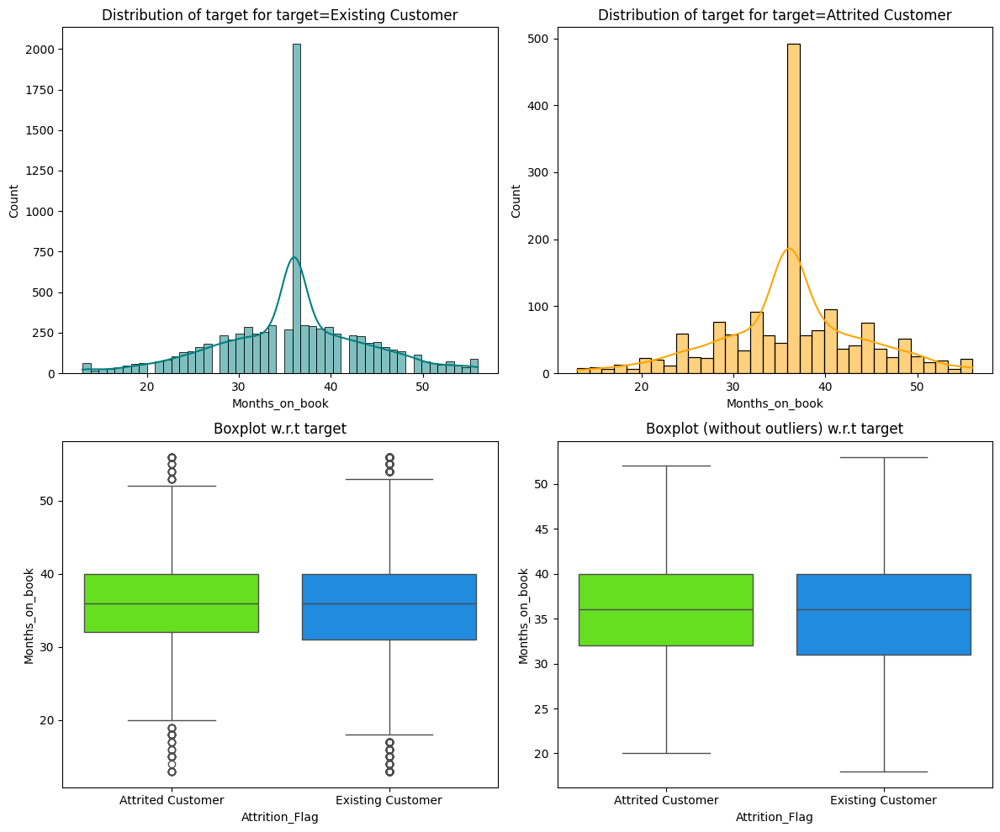

In [ ]:
distribution_plot_wrt_target(data, 'Months_on_book', 'Attrition_Flag')

**12. Attrition_Flag vs Credit_Limit**

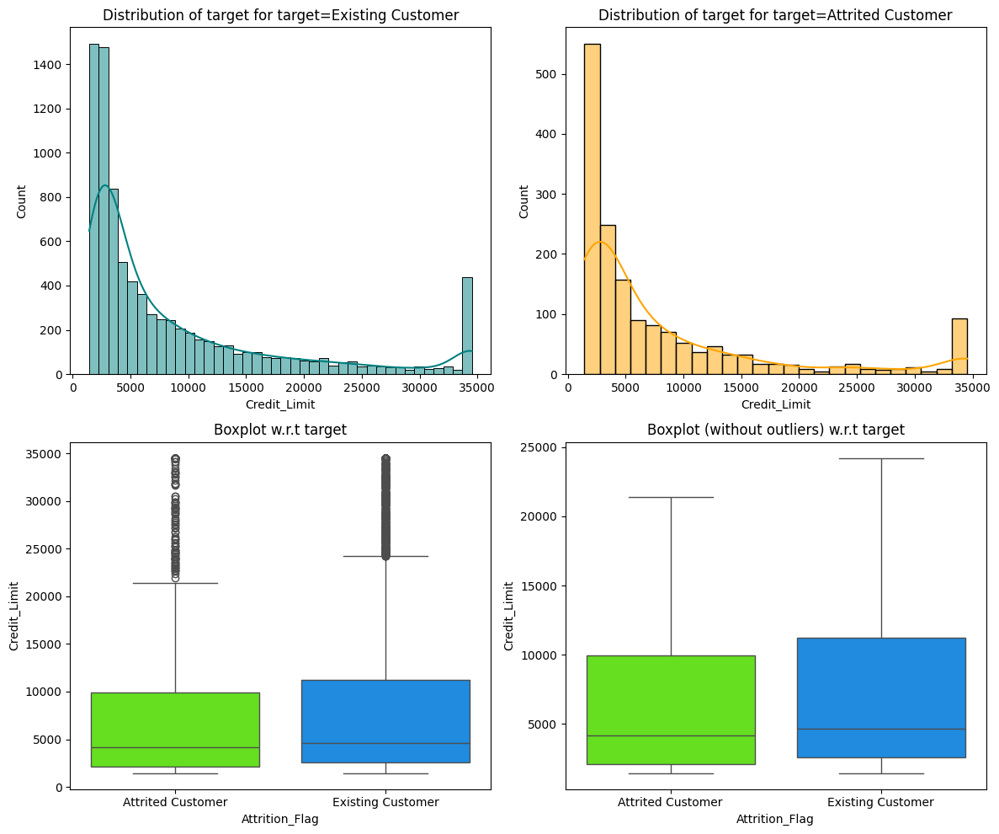

In [ ]:
distribution_plot_wrt_target(data, 'Credit_Limit', 'Attrition_Flag')

**13. Attrition_Flag vs Total_Revolving_Bal**

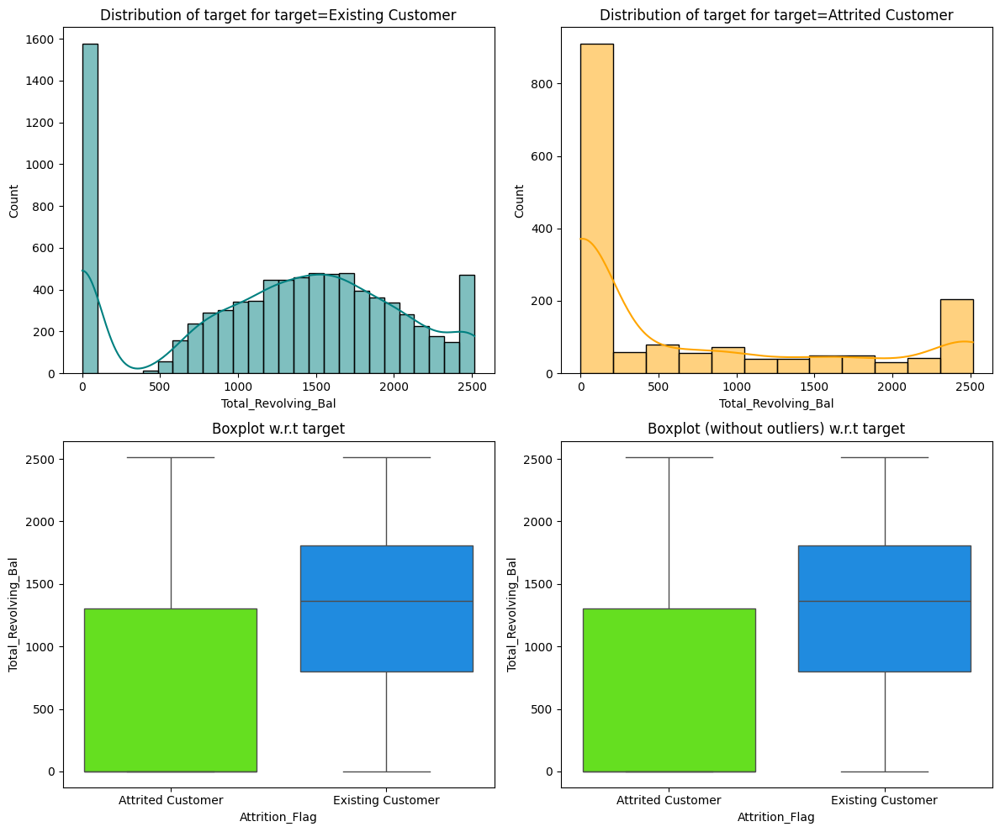

In [ ]:
distribution_plot_wrt_target(data, 'Total_Revolving_Bal', 'Attrition_Flag')

**14. Attrition_Flag vs Avg_Open_To_Buy**

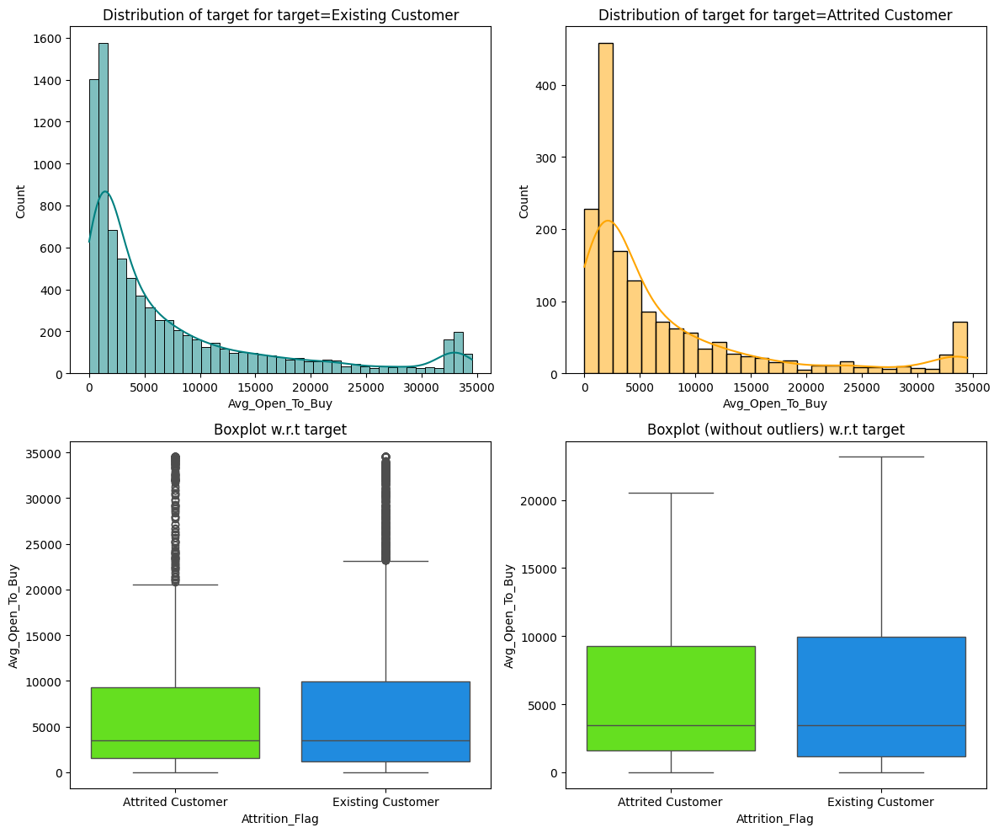

In [ ]:
distribution_plot_wrt_target(data, 'Avg_Open_To_Buy', 'Attrition_Flag')

**15. Attrition_Flag vs Total_Amt_Chng_Q4_Q1**

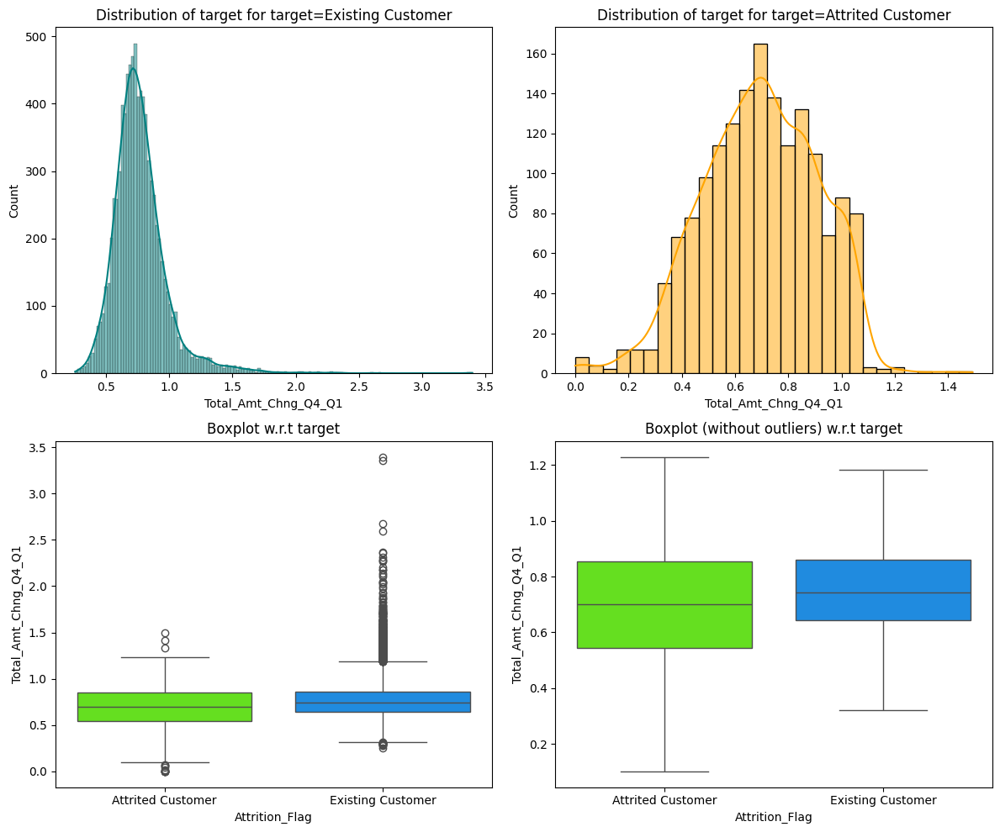

In [ ]:
distribution_plot_wrt_target(data, 'Total_Amt_Chng_Q4_Q1', 'Attrition_Flag')

**16. Attrition_Flag vs Total_Trans_Amt**

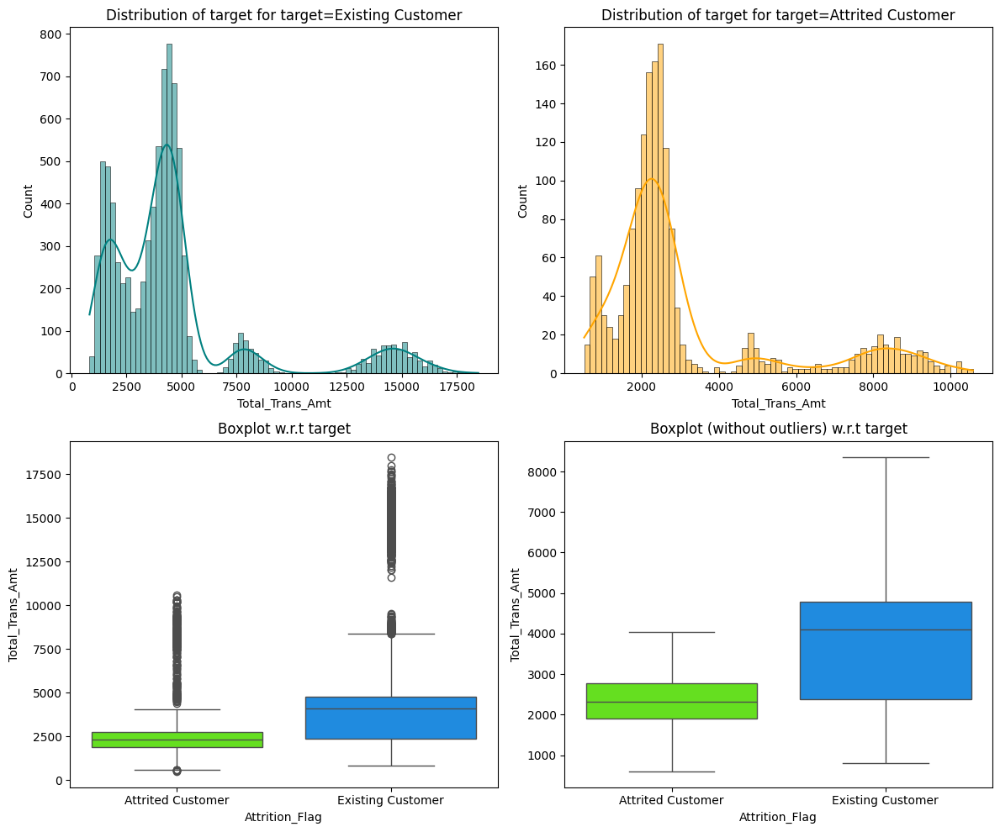

In [ ]:
distribution_plot_wrt_target(data, 'Total_Trans_Amt', 'Attrition_Flag')

**17. Attrition_Flag vs Total_Trans_Ct**

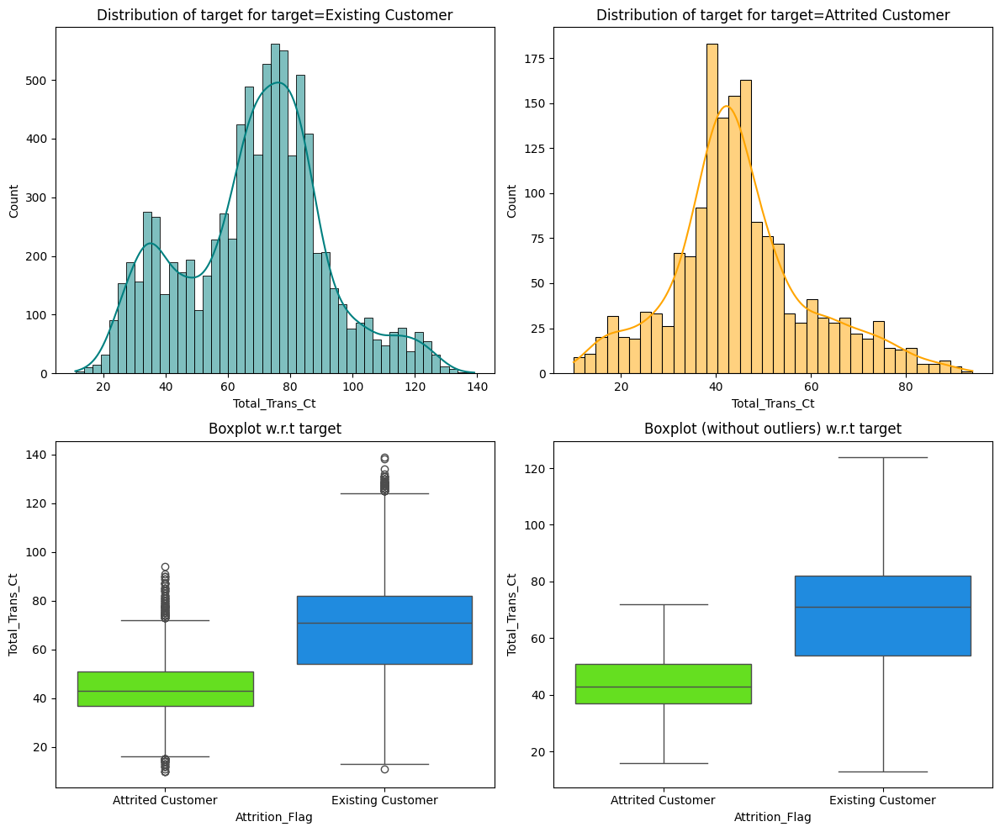

In [ ]:
distribution_plot_wrt_target(data, 'Total_Trans_Ct', 'Attrition_Flag')

**18. Attrition_Flag vs Total_Ct_Chng_Q4_Q1**

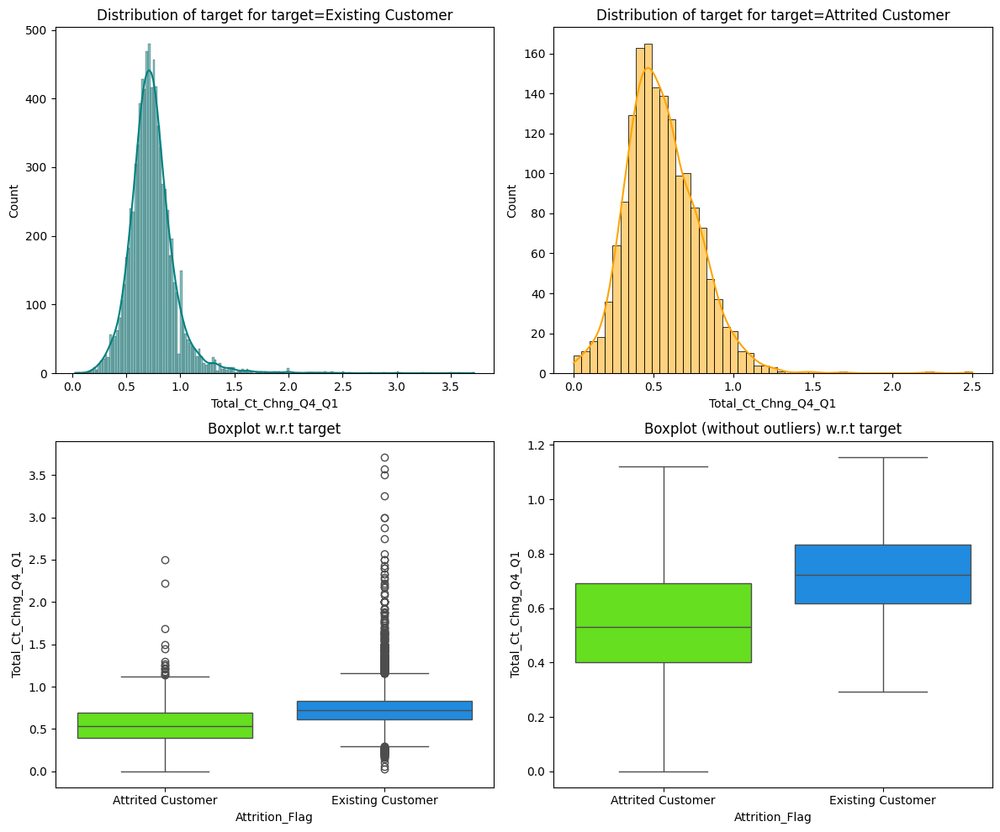

In [ ]:
distribution_plot_wrt_target(data, 'Total_Ct_Chng_Q4_Q1', 'Attrition_Flag')

Q4. How does the change in transaction amount between Q4 and Q1 (total_ct_change_Q4_Q1) vary by the customer's account status (Attrition_Flag)?

Median Total count change is lowest for attrited customers than the existing class. But the range is greater for attited customers than axisting class.

**19. Attrition_Flag vs Avg_Utilization_Ratio**

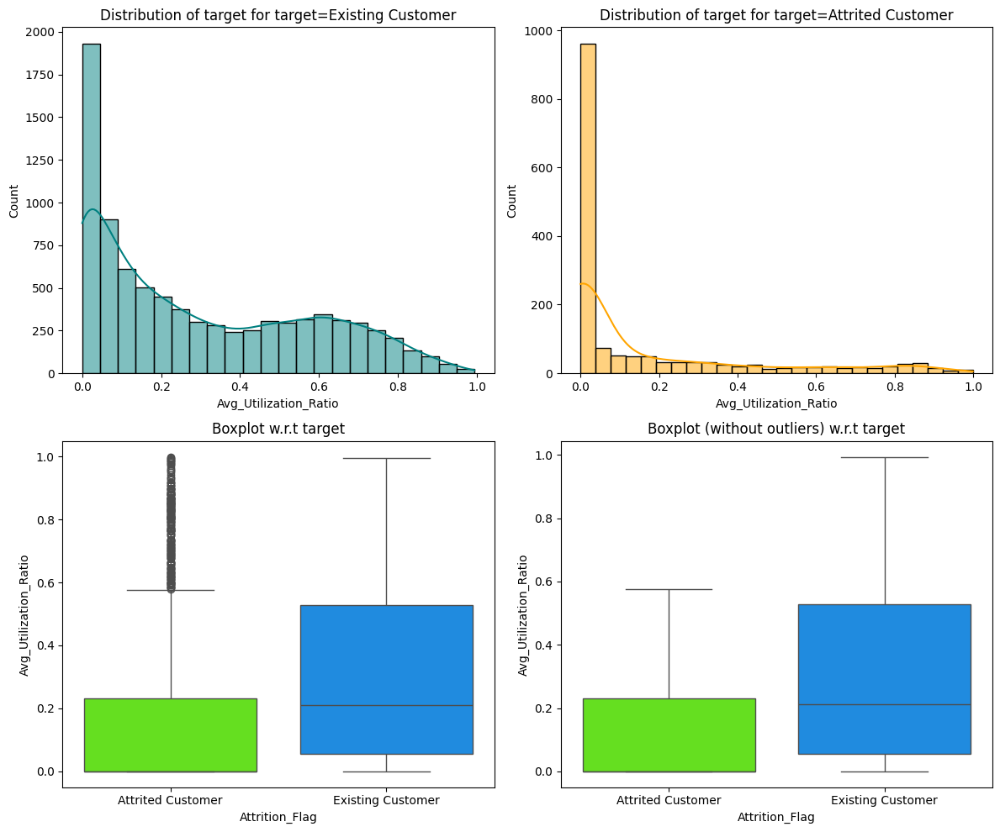

In [ ]:
distribution_plot_wrt_target(data, 'Avg_Utilization_Ratio', 'Attrition_Flag')

## **Data Pre-processing continue**

In [ ]:
# First let's convert 'abc' class in Income_Category to NaN, so that we can impute them later
data['Income_Category'].unique()

['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K', '$120K +', 'abc']
Categories (6, object): ['$120K +', '$40K - $60K', '$60K - $80K', '$80K - $120K',
                         'Less than $40K', 'abc']

In [ ]:
data['Income_Category'] = data['Income_Category'].replace('abc', np.nan)
data['Income_Category'].unique()

['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K', '$120K +', NaN]
Categories (5, object): ['$120K +', '$40K - $60K', '$60K - $80K', '$80K - $120K',
                         'Less than $40K']

#### **Identifying Missing Values**

In [ ]:
data.isnull().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category             1112
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

#### **Outlier Detection**

In [ ]:
# Select only numeric columns before calculating quantiles
numeric_data = data.select_dtypes(include='number')

Q1 = numeric_data.quantile(0.25)  # To find the 25th percentile
Q3 = numeric_data.quantile(0.75)  # To find the 75th percentile

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

# Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower = (Q1 - 1.5 * IQR)
upper = (Q3 + 1.5 * IQR)

In [ ]:
# Percentage of outliers in each column
((numeric_data.select_dtypes(include=["float64", "int64"]) < lower) | (numeric_data.select_dtypes(include=["float64", "int64"]) > upper)).sum() / len(data) * 100

Customer_Age               0.020
Dependent_count            0.000
Months_on_book             3.812
Total_Relationship_Count   0.000
Months_Inactive_12_mon     3.268
Contacts_Count_12_mon      6.211
Credit_Limit               9.717
Total_Revolving_Bal        0.000
Avg_Open_To_Buy            9.509
Total_Amt_Chng_Q4_Q1       3.910
Total_Trans_Amt            8.848
Total_Trans_Ct             0.020
Total_Ct_Chng_Q4_Q1        3.891
Avg_Utilization_Ratio      0.000
dtype: float64

Observations:

*   Credit_Limit has 9.7% of outliers followed by Avg_Open_To_Buy with 9.5% outliers.
*   Let's leave the outliers for now and after checking the model performance we can decide whether to treat the outliers or not.

#### **Multicollinearity**

In [ ]:
# check for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = numeric_data.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(numeric_data.values, i)
                          for i in range(len(numeric_data.columns))]

print(vif_data)

                     feature    VIF
0               Customer_Age 75.091
1            Dependent_count  4.059
2             Months_on_book 56.437
3   Total_Relationship_Count  7.476
4     Months_Inactive_12_mon  6.085
5      Contacts_Count_12_mon  5.539
6               Credit_Limit    inf
7        Total_Revolving_Bal    inf
8            Avg_Open_To_Buy    inf
9       Total_Amt_Chng_Q4_Q1 13.941
10           Total_Trans_Amt  8.635
11            Total_Trans_Ct 23.200
12       Total_Ct_Chng_Q4_Q1 11.808
13     Avg_Utilization_Ratio  5.760


In [ ]:
data1 = data.copy() # New data frame original data
data2 = data.copy() # New data frame for removed multicollinearity

In [ ]:
data2 = data2.drop(columns=['Avg_Open_To_Buy', 'Customer_Age'], axis=1) # avg open to buy behave similar to credit limit, either one of them has no good relationship with attrition flag, dropping avg open to buy.
# customer age has no good correlation with attrition and it is highly correlatd with months on book, so dropping it as well.

In [ ]:
data2.columns

Index(['Attrition_Flag', 'Gender', 'Dependent_count', 'Education_Level',
       'Marital_Status', 'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

## **Split Data**

In [ ]:
X = data1.drop(["Attrition_Flag"], axis=1)
y = data1['Attrition_Flag'].apply(lambda x : 1 if x=='Attrited Customer' else 0)

In [ ]:
# Splitting data into training, validation and test set:

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


In [ ]:
print("Number of rows in train data =", X_train.shape[0])
print("Number of rows in validation data =", X_val.shape[0])
print("Number of rows in test data =", X_test.shape[0])

Number of rows in train data = 6075
Number of rows in validation data = 2026
Number of rows in test data = 2026


## Missing value imputation




In [ ]:
data1.isnull().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category             1112
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Create a SimpleImputer instance with the 'most_frequent' strategy
imputer = SimpleImputer(strategy='most_frequent')

# Get list of missing attributes
col_impute = ["Education_Level", "Marital_Status", "Income_Category"]

In [ ]:
# Fit and transform the train data
X_train[col_impute] = imputer.fit_transform(X_train[col_impute])

# Transform the validation data
X_val[col_impute]  =  imputer.fit_transform(X_val[col_impute])

# Transform the test data
X_test[col_impute] = imputer.fit_transform(X_test[col_impute])

In [ ]:
# Checking that no column has missing values in train or test sets
print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

Training Set

In [ ]:
cols = X_train.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train[i].value_counts())
    print("*" * 30)

Gender
F    3193
M    2882
Name: count, dtype: int64
******************************
Education_Level
Graduate         2782
High School      1228
Uneducated        881
College           618
Post-Graduate     312
Doctorate         254
Name: count, dtype: int64
******************************
Marital_Status
Married     3276
Single      2369
Divorced     430
Name: count, dtype: int64
******************************
Income_Category
Less than $40K    2783
$40K - $60K       1059
$80K - $120K       953
$60K - $80K        831
$120K +            449
Name: count, dtype: int64
******************************
Card_Category
Blue        5655
Silver       339
Gold          69
Platinum      12
Name: count, dtype: int64
******************************


Validation Set

In [ ]:
cols = X_val.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_val[i].value_counts())
    print("*" * 30)

Gender
F    1095
M     931
Name: count, dtype: int64
******************************
Education_Level
Graduate         917
High School      404
Uneducated       306
College          199
Post-Graduate    101
Doctorate         99
Name: count, dtype: int64
******************************
Marital_Status
Married     1100
Single       770
Divorced     156
Name: count, dtype: int64
******************************
Income_Category
Less than $40K    957
$40K - $60K       361
$80K - $120K      293
$60K - $80K       279
$120K +           136
Name: count, dtype: int64
******************************
Card_Category
Blue        1905
Silver        97
Gold          21
Platinum       3
Name: count, dtype: int64
******************************


Test Set

In [ ]:
cols = X_test.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_test[i].value_counts())
    print("*" * 30)

Gender
F    1070
M     956
Name: count, dtype: int64
******************************
Education_Level
Graduate         948
High School      381
Uneducated       300
College          196
Post-Graduate    103
Doctorate         98
Name: count, dtype: int64
******************************
Marital_Status
Married     1060
Single       804
Divorced     162
Name: count, dtype: int64
******************************
Income_Category
Less than $40K    933
$40K - $60K       370
$60K - $80K       292
$80K - $120K      289
$120K +           142
Name: count, dtype: int64
******************************
Card_Category
Blue        1876
Silver       119
Gold          26
Platinum       5
Name: count, dtype: int64
******************************


## Creating Dummies

In [ ]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 29) (2026, 29) (2026, 29)


## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are arrtrited customers correctly predicted by the model.
- False negatives (FN) are attrited customers who was not identified by the model.
- False positives (FP) are customers who has not attrited, but model misidentified them as attrited.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of attritions are predicted correctly by the model while minimizing the false negatives.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a customer will not attrite, but in reality he/she attrite that will cost the bank.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

### Model Building with original data

Sample code for model building with original data

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Decision tree", DecisionTreeClassifier(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("AdaBoost", AdaBoostClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1)))
'_______' ## Complete the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Decision tree: 1.0
Bagging: 0.985655737704918
Random forest: 1.0
AdaBoost: 0.826844262295082
GBM: 0.875
XGBoost: 1.0

Validation Performance:

Decision tree: 0.8159509202453987
Bagging: 0.8128834355828221
Random forest: 0.7975460122699386
AdaBoost: 0.852760736196319
GBM: 0.8558282208588958
XGBoost: 0.901840490797546


In [ ]:
print("\nOriginal data - Training and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_train = recall_score(y_train, model.predict(X_train))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference2 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference2))


Original data - Training and Validation Performance Difference:

Decision tree: Training Score: 1.0000, Validation Score: 0.8160, Difference: 0.1840
Bagging: Training Score: 0.9857, Validation Score: 0.8129, Difference: 0.1728
Random forest: Training Score: 1.0000, Validation Score: 0.7975, Difference: 0.2025
AdaBoost: Training Score: 0.8268, Validation Score: 0.8528, Difference: -0.0259
GBM: Training Score: 0.8750, Validation Score: 0.8558, Difference: 0.0192
XGBoost: Training Score: 1.0000, Validation Score: 0.9018, Difference: 0.0982


**Observations for original data:**

*   Bagging, Random forest, Decision tree and XGBoost shows over fitting to the training set.
*   AdaBoost and GBoost are more generalized, and AdaBoost even performs much better on validation set.

### Model Building with Oversampled data


In [ ]:
sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

print("Before Oversampling, counts of label 'Attrited Customer': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'Existing Customer': {} \n".format(sum(y_train == 0)))

print("After Oversampling, counts of label 'Attrited Customer': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'Existing Customer': {} \n".format(sum(y_train_over == 0)))

print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before Oversampling, counts of label 'Attrited Customer': 976
Before Oversampling, counts of label 'Existing Customer': 5099 

After Oversampling, counts of label 'Attrited Customer': 5099
After Oversampling, counts of label 'Existing Customer': 5099 

After Oversampling, the shape of train_X: (10198, 29)
After Oversampling, the shape of train_y: (10198,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Decision Tree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1, class_weight='balanced')))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Decision Tree: 1.0
Bagging: 0.9976465973720338
Random forest: 1.0
Adaboost: 0.964698960580506
GBM: 0.9792116101196313
XGBoost: 1.0

Validation Performance:

Decision Tree: 0.8650306748466258
Bagging: 0.8619631901840491
Random forest: 0.8619631901840491
Adaboost: 0.901840490797546
GBM: 0.9049079754601227
XGBoost: 0.9294478527607362


In [ ]:
print("\nOversampled - Training and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_train = recall_score(y_train_over, model.predict(X_train_over))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference2 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference2))


Oversampled - Training and Validation Performance Difference:

Decision Tree: Training Score: 1.0000, Validation Score: 0.8650, Difference: 0.1350
Bagging: Training Score: 0.9976, Validation Score: 0.8620, Difference: 0.1357
Random forest: Training Score: 1.0000, Validation Score: 0.8620, Difference: 0.1380
Adaboost: Training Score: 0.9647, Validation Score: 0.9018, Difference: 0.0629
GBM: Training Score: 0.9792, Validation Score: 0.9049, Difference: 0.0743
XGBoost: Training Score: 1.0000, Validation Score: 0.9294, Difference: 0.0706


Observations on Oversampled:

*   Random forest, Decision tree, Bagging and XGBoost still show over fitting.
*   AdaBoost and GBoost XGBoostare more generalized, and perform well.

### Model Building with Undersampled data

In [ ]:
rus = RandomUnderSampler(random_state=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

print("Before Under Sampling, counts of label 'Attrited Customer': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'Existing Customer': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Attrited Customer': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'Existing Customer': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Attrited Customer': 976
Before Under Sampling, counts of label 'Existing Customer': 5099 

After Under Sampling, counts of label 'Attrited Customer': 976
After Under Sampling, counts of label 'Existing Customer': 976 

After Under Sampling, the shape of train_X: (1952, 29)
After Under Sampling, the shape of train_y: (1952,) 



In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Decision Tree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1, class_weight='balanced')))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("XGBoost", XGBClassifier(random_state=1, class_weight='balanced')))


print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores))


Training Performance:

Decision Tree: 1.0
Bagging: 0.9907786885245902
Random forest: 1.0
Adaboost: 0.9528688524590164
GBM: 0.9805327868852459
XGBoost: 1.0

Validation Performance:

Decision Tree: 0.9202453987730062
Bagging: 0.9294478527607362
Random forest: 0.9386503067484663
Adaboost: 0.9601226993865031
GBM: 0.9570552147239264
XGBoost: 0.9693251533742331


In [ ]:
print("\nUndersampled - Training and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores_train = recall_score(y_train_un, model.predict(X_train_un))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference3 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference3))


Undersampled - Training and Validation Performance Difference:

Decision Tree: Training Score: 1.0000, Validation Score: 0.9202, Difference: 0.0798
Bagging: Training Score: 0.9908, Validation Score: 0.9294, Difference: 0.0613
Random forest: Training Score: 1.0000, Validation Score: 0.9387, Difference: 0.0613
Adaboost: Training Score: 0.9529, Validation Score: 0.9601, Difference: -0.0073
GBM: Training Score: 0.9805, Validation Score: 0.9571, Difference: 0.0235
XGBoost: Training Score: 1.0000, Validation Score: 0.9693, Difference: 0.0307


**Observations on undersampled:**

*   Decision Tree, Random forest, XGBoost are still overfitted.
*   Bagging has slightly improved.
*   GBM and AdaBoost perform well, the models are well generalized and AdaBoost works much better on validation set.

*   Therefore we can tune undersampled GBM and undersampled AdaBoost to see which one performs better.








### HyperparameterTuning

#### **Sample tuning method for GradientBoost Classifier with undersampled data**

In [ ]:
%%time

#Creating pipeline
Model = GradientBoostingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'n_estimators': 75, 'max_features': 0.7, 'learning_rate': 0.1, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9508267922553637:
CPU times: user 2.91 s, sys: 440 ms, total: 3.35 s
Wall time: 1min 41s


In [ ]:
tuned_gbm1 = GradientBoostingClassifier(
    random_state=1,
    subsample=0.9,
    n_estimators=75,
    max_features=0.7,
    learning_rate=0.1,
    init=AdaBoostClassifier(random_state=1),
)
tuned_gbm1.fit(X_train_un, y_train_un)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.7, n_estimators=75, random_state=1,
                           subsample=0.9)

In [ ]:
# Checking model's performance on training set
gbm1_train = model_performance_classification_sklearn(tuned_gbm1, X_train_un, y_train_un)
gbm1_train

,Accuracy,Recall,Precision,F1
0,0.970,0.977,0.964,0.970


In [ ]:
# Checking model's performance on validation set
gbm1_val = model_performance_classification_sklearn(tuned_gbm1, X_val, y_val)
gbm1_val

,Accuracy,Recall,Precision,F1
0,0.938,0.957,0.738,0.833


**Sample tuning method for GradientBoost Classifier with oversampled data**

In [ ]:
%%time

#Creating pipeline
Model = GradientBoostingClassifier(random_state=1)

#Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.9, 'n_estimators': 100, 'max_features': 0.5, 'learning_rate': 0.1, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9541157228347668:
CPU times: user 10.5 s, sys: 1.18 s, total: 11.7 s
Wall time: 7min 37s


In [ ]:
tuned_gbm2 = GradientBoostingClassifier(
    random_state=1,
    subsample=0.9,
    n_estimators=100,
    max_features=0.5,
    learning_rate=0.1,
    init=AdaBoostClassifier(random_state=1),
)
tuned_gbm2.fit(X_train_over, y_train_over)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.5, random_state=1, subsample=0.9)

In [ ]:
# Checking model's performance on training set
gbm2_train = model_performance_classification_sklearn(tuned_gbm2, X_train_over, y_train_over)
gbm2_train

,Accuracy,Recall,Precision,F1
0,0.975,0.979,0.972,0.975


In [ ]:
# Checking model's performance on validation set
gbm2_val = model_performance_classification_sklearn(tuned_gbm2, X_val, y_val)
gbm2_val

,Accuracy,Recall,Precision,F1
0,0.961,0.911,0.853,0.881


#### **Sample tuning method for AdaBoost with undersampled data**

In [ ]:
%%time

# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un, y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.05, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.9467346938775512:
CPU times: user 1.68 s, sys: 183 ms, total: 1.86 s
Wall time: 47.1 s


In [ ]:
tuned_adb = AdaBoostClassifier(
    random_state=1,
    n_estimators=100,
    learning_rate=0.05,
    base_estimator=DecisionTreeClassifier(max_depth=3, random_state=1),
)
tuned_adb.fit(X_train_un, y_train_un)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.05, n_estimators=100, random_state=1)

In [ ]:
# Checking model's performance on training set
adb_train = model_performance_classification_sklearn(tuned_adb, X_train_un, y_train_un)
adb_train

,Accuracy,Recall,Precision,F1
0,0.973,0.978,0.968,0.973


In [ ]:
# Checking model's performance on validation set
adb_val = model_performance_classification_sklearn(tuned_adb, X_val, y_val)
adb_val

,Accuracy,Recall,Precision,F1
0,0.937,0.966,0.731,0.832


#### **Sample tuning method for AdaBoost with oversampled data**

In [ ]:
%%time

# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over, y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.9515668956493293:
CPU times: user 8.87 s, sys: 601 ms, total: 9.47 s
Wall time: 3min 58s


In [ ]:
tuned_adb2 = AdaBoostClassifier(
    random_state=1,
    n_estimators=100,
    learning_rate=0.1,
    base_estimator=DecisionTreeClassifier(max_depth=3, random_state=1),
)
tuned_adb2.fit(X_train_over, y_train_over)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.1, n_estimators=100, random_state=1)

In [ ]:
# Checking model's performance on training set
adb2_train = model_performance_classification_sklearn(tuned_adb2, X_train_over, y_train_over)
adb2_train

,Accuracy,Recall,Precision,F1
0,0.985,0.985,0.985,0.985


In [ ]:
# Checking model's performance on validation set
adb2_val = model_performance_classification_sklearn(tuned_adb2, X_val, y_val)
adb2_val

,Accuracy,Recall,Precision,F1
0,0.968,0.908,0.894,0.901


## Model Comparison and Final Model Selection

In [ ]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        gbm1_train.T,
        gbm2_train.T,
        adb_train.T,
        adb2_train.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Gradient boosting trained with Undersampled data",
    "Gradient boosting trained with Oversampled data",
    "AdaBoost trained with Undersampled data",
    "AdaBoost trained with Oversampled data",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Gradient boosting trained with Undersampled data,Gradient boosting trained with Oversampled data,AdaBoost trained with Undersampled data,AdaBoost trained with Oversampled data
Accuracy,0.970,0.975,0.973,0.985
Recall,0.977,0.979,0.978,0.985
Precision,0.964,0.972,0.968,0.985
F1,0.970,0.975,0.973,0.985


In [ ]:
# Validation performance comparison

models_val_comp_df = pd.concat(
    [
        gbm1_val.T,
        gbm2_val.T,
        adb_val.T,
        adb2_val.T,
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "Gradient boosting trained with Undersampled data",
    "Gradient boosting trained with Oversampled data",
    "AdaBoost trained with Undersampled data",
    "AdaBoost trained with Oversampled data",
]
print("Validation performance comparison:")
models_val_comp_df

Validation performance comparison:


,Gradient boosting trained with Undersampled data,Gradient boosting trained with Oversampled data,AdaBoost trained with Undersampled data,AdaBoost trained with Oversampled data
Accuracy,0.938,0.961,0.937,0.968
Recall,0.957,0.911,0.966,0.908
Precision,0.738,0.853,0.731,0.894
F1,0.833,0.881,0.832,0.901




*   Undersampled AdaBoost is the best model considering the recall score followed by the undersampled Gradient Boost which also performs quite similar.
*   Precision and F1 scores of the oversampled models are better than the undersampled models, however in this case as Recall is much more important we should select undersampled AdaBoost or Gradient Boost models.  

*   Let's check the test performance on undersampled AdaBoost.





### Final performance on Test Set

In [ ]:
# Let's check the performance on test set
ada_test = model_performance_classification_sklearn(tuned_adb, X_test, y_test)
ada_test

,Accuracy,Recall,Precision,F1
0,0.934,0.969,0.718,0.825


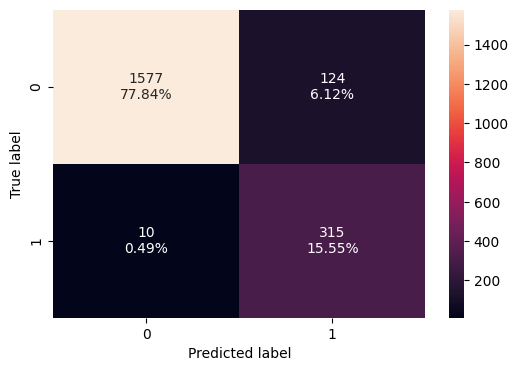

In [ ]:
confusion_matrix_sklearn(tuned_adb, X_test, y_test)



*   Undersampled AdaBoost gives enhanced performance for the test set. Also the model is well generalized. It also has a good precision and a F1 score.

*   As the model performed well we don't need to treat the outleirs and do more feature engineering at this stage. Depending on the stakeholder's requirements we can deal with this later.

## Feature Importance

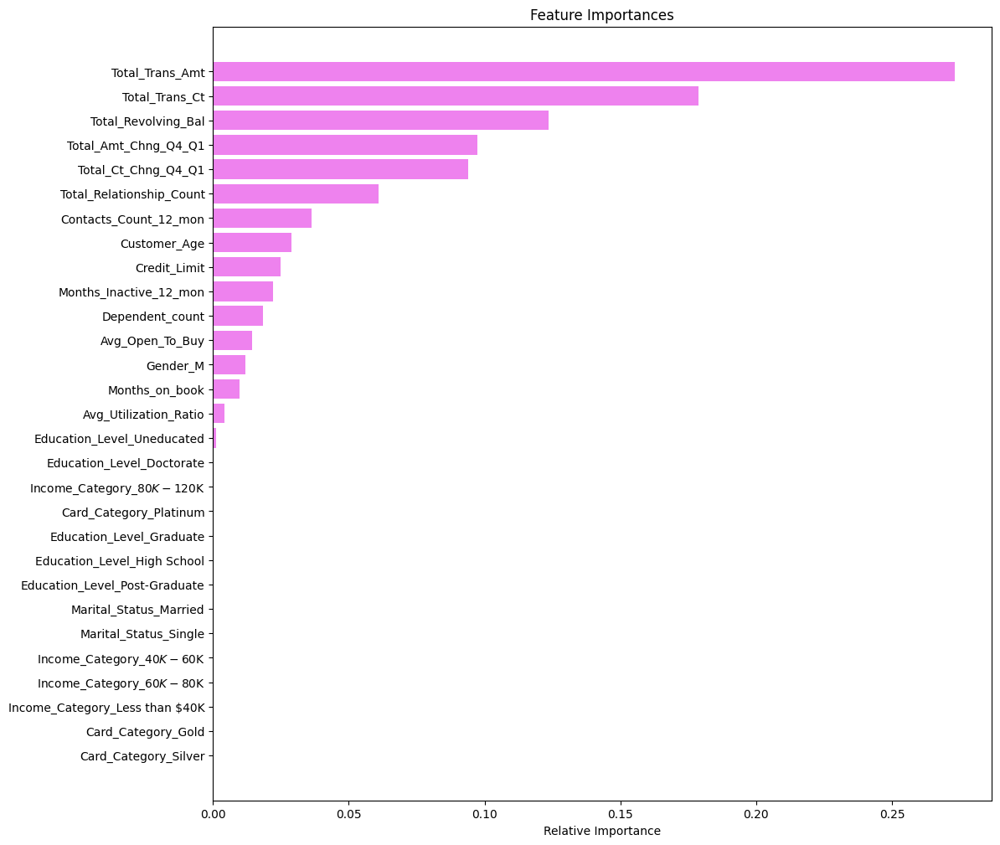

In [ ]:
# Feature importance using tuned AdaBoost model
feature_names = X_train.columns
importances = tuned_adb.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

# Business Insights and Conclusions

1. The model can predict with a recall of 0.978, an accuracy of 0.973,  precision of 0.968 and F1-score of 0.973. The model shows great performance with validation and test data.
2. Bank can deploy this model to identify customers who are at the risk of attrition. Find out the reasons for attrition. Based on which bank can improve its services so that customers do not renounce their credit cards.
3.   The most important features are as follows. Total_Trans_Amt, Total_Trans_Ct, Total_Revolving_Balance, Total_Amt_Chng_Q4_Q1, Total_Ct_Chng_Q4_Q1, Total_Relationship_Count etc.
4. When the Total_Trans_Amt median is lower there is a tendency towards attrition. This behavior is also true for Total_Trans_Ct and Total_Revolving_Balance. Therefore the bank should identify these customers and take necessary precautions to prevent their credit card renounce.
5. Also bank should identify the customers with Total_Relationship_Count 1,2,3 and customers who contacts bank frequently like 6, 5 times per year, these customers also show tendency towards attrition.

